## Image Captioning 

### Given an image the model should be able to caption the image.

### Note: The commented code ''' ''' must be executed only once

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
import glob
import pickle
from time import time

In [2]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector, Merge,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input

/usr/local/lib/python3.6/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
# Below file contains captions for every image - Open the file for better understanding the structure
# Each image is assigned 5 reference captions
token = "../../storage/image_caption/dataset/TextFiles/Flickr8k.token.txt"

# read the file and create a list containing all the lines in the file
f = open(token, 'r')
captions = f.read().strip().split('\n')
f.close()

In [4]:
# Create a dictionary which contains image names as keys and the list of related captions as values
d = {}
for i, row in enumerate(captions):
    # Split the name and the caption in each row
    row = row.split('\t')
    # Remove the last 2 characters which indicate the caption number
    row[0] = row[0][:len(row[0])-2]
    if row[0] in d:
        d[row[0]].append(row[1])
    else:
        d[row[0]] = [row[1]]

In [5]:
# Below path contains all the images
images = '../../storage/image_caption/dataset/Flicker8k_Dataset/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

In [6]:
len(img)

8091

In [7]:
# Below file conatains the names of images to be used in train data
train_images_file = '../../storage/image_caption/dataset/TextFiles/Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images

In [8]:
# Below file conatains the names of images to be used in validation data
val_images_file = '../../storage/image_caption/dataset/TextFiles/Flickr_8k.devImages.txt'
# Read the validation image names in a set
val_images = set(open(val_images_file, 'r').read().strip().split('\n'))

# Create a list of all the validation images with their full path names
val_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in val_images: # Check if the image belongs to validation set
        val_img.append(i) # Add it to the list of validation images

In [9]:
# Below file conatains the names of images to be used in test data
test_images_file = '../../storage/image_caption/dataset/TextFiles/Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images

In [ ]:
'''def preprocess(image_path):
    # Convert all the images to size 299x299 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    x = preprocess_input(x)
    return x'''

In [ ]:
'''# Load the inception v3 model
model = InceptionV3(weights='imagenet')'''

In [ ]:
'''# Create a new model, by removing the last layer (output layer) from the inception v3
model_new = Model(model.input, model.layers[-2].output)'''

#### Note: The output shape is (1, 2048)

In [ ]:
'''# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec'''

In [ ]:
'''# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
start = time()
encoding_train = {}
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)'''

In [ ]:
'''# Save the bottleneck train features to disk
with open("Pickle/encoded_train_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_train, encoded_pickle)'''

In [ ]:
'''# Call the funtion to encode all the test images - Execute this only once
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)'''

In [ ]:
'''# Save the bottleneck test features to disk
with open("Pickle/encoded_test_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle)'''

In [10]:
# Load the bottleneck train features
with open("../../storage/image_caption/dataset/Pickle/encoded_train_images.pkl", "rb") as encoded_pickle:
    encoding_train = pickle.load(encoded_pickle)

In [11]:
# Load the bottleneck test features
with open("../../storage/image_caption/dataset/Pickle/encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = pickle.load(encoded_pickle)

#### Separate out the train, test and validation data from the dictionary "d" created above

In [12]:
train_d = {}
for i in train_img:
    if i[len(images):] in d:
        train_d[i] = d[i[len(images):]]

In [13]:
val_d = {}
for i in val_img:
    if i[len(images):] in d:
        val_d[i] = d[i[len(images):]]

In [14]:
test_d = {}
for i in test_img:
    if i[len(images):] in d:
        test_d[i] = d[i[len(images):]]

In [15]:
# Create a list of all captions in train data
all_train_captions = []
for key, val in train_d.items():
    for cap in val:
        # Add full-stop at the end of the caption if not already present
        if cap[-1] == '.':
            all_train_captions.append(cap)
        else:
            all_train_captions.append(cap + ' .')

In [16]:
len(all_train_captions)

30000

In [17]:
# Consider only those words which appear at least 20 times in the corpus
word_count_threshold = 20

# Key: word, Value: No. of times it appears
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.lower().split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1
vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7707 -> 1070


### The numbers above can be slighty different

In [18]:
# Create two dictionaries

# Index to word dictionary
ixtoword = {}
ixtoword[0] = '#start#'

# Word to index dictionary
wordtoix = {}
wordtoix['#start#'] = 0

In [19]:
ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [20]:
word_counts['.'] = nsents
word_counts['#start#'] = nsents

In [22]:
n_words = len(wordtoix)
n_words

1071

In [23]:
# Calculate length of the maximum caption
maxlen = np.max([x for x in map(lambda x: len(x.split(' ')), captions)])
maxlen

38

In [23]:
'''# Create a new file containg train image names and their captions
f = open('Files/training_dataset.txt', 'w')
f.write("image_id\tcaptions\n")

for key, val in train_d.items():
    for i in val:
        f.write(key[len(images):] + "\t" + i + "\n")

f.close()'''

In [24]:
# Read the file in a dataframe
df = pd.read_csv('Files/training_dataset.txt', delimiter='\t')
df.head(10)

,image_id,captions
0,2975073156_7543ed326f.jpg,"young , boys one boy is hitting another boy wh..."
1,2975073156_7543ed326f.jpg,Two boys fighting in a dirt paved parking lot ...
2,2975073156_7543ed326f.jpg,Two boys in blue shirts are in front of a grey...
3,2975073156_7543ed326f.jpg,Two boys in blue shirts fighting behind a grey...
4,2975073156_7543ed326f.jpg,two boys in blue shirts fighting in a parking lot
5,566921157_07c18a41e2.jpg,A brown and a brown dog are running .
6,566921157_07c18a41e2.jpg,Two dogs running in the dirt
7,566921157_07c18a41e2.jpg,Two dogs running over packed dirt and rocks
8,566921157_07c18a41e2.jpg,Two dogs run through mud .
9,566921157_07c18a41e2.jpg,Two large dogs run along a muddy path .


In [25]:
# Create an iterator of the dataframe
iter = df.iterrows()
imgs = []
caps = []

# iterate over each row of the dataframe
for i in range(df.shape[0]):
    x = next(iter)
    imgs.append(x[1][0]) # store the image name
    caps.append(x[1][1]) # store the corresponding caption

In [26]:
len(caps), len(imgs)

(30000, 30000)

In [27]:
caps[0], imgs[0]

('young , boys one boy is hitting another boy while the third boy smiles in the background',
 '2975073156_7543ed326f.jpg')

## Model

In [28]:
# Hyper parameters
DIM_INPUT=2048
DIM_EMBED=256
DIM_HIDDEN=256
MAX_LEN=maxlen
BATCH_SIZE=128
N_WORDS=n_words

#### The model architecture is as follows:

![title](Images/model.jpg)

* FEAT - image features
* CAPTIONS - for training, true caption. For prediction, initially #start# tag and then previous prediction
* MASK - record previous words
* POSITION - position of current word in a sentence

In [29]:
# Index of the current word
sent_input = Input(shape=(1,))
# Image features
img_input = Input(shape=(DIM_INPUT,))
# Mask on words already generated in the caption
mask_input = Input(shape=(N_WORDS,))
# Position of the current word in the caption
position_input = Input(shape=(MAX_LEN,))

# Add embedding layer to the current word
sent_embed_layer = Embedding(output_dim=DIM_EMBED, input_dim=N_WORDS, input_length=1)(sent_input)
sent_embed_layer = Reshape((DIM_EMBED,))(sent_embed_layer)
# Concatenate [current word, position]
sent_embed_layer = concatenate([sent_embed_layer, position_input])
# Add a Dense Layer to make output os size "DIM_EMBED"
sent_embed_layer = Dense(DIM_EMBED)(sent_embed_layer)

# Concatenate image features, [current word, position] and mask
img_sent_merge_layer = concatenate([img_input, sent_embed_layer, mask_input])
img_sent_merge_layer = Reshape((1, DIM_HIDDEN+DIM_INPUT+N_WORDS))(img_sent_merge_layer)

# Add LSTM with 512 units
lstm = LSTM(512)(img_sent_merge_layer)
# Add dropout
lstm = Dropout(0.25)(lstm)
# Add output layers of size "N_WORDS" (Size of vocabulary)
lstm = Dense(N_WORDS)(lstm)
# Add Batch Normalization
lstm = BatchNormalization()(lstm)
# Activation of output layer is Softmax
out = Activation('softmax')(lstm)

# Final Model
model = Model(input=[img_input, sent_input, mask_input, position_input], output=out)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=Tensor("ac...)`


In [31]:
model.compile(loss='categorical_crossentropy', optimizer=optimizers.Adam(lr=0.001,
                                                                         beta_1=0.9,
                                                                         beta_2=0.999,
                                                                         epsilon=1e-08,
                                                                         decay=0))

In [32]:
# Create an iterator over all the captions
index = (np.arange(len(all_train_captions)).astype(int))
# Randomly shuffle the iterator
np.random.shuffle(index)

In [33]:
epochs = 10
epoch_time = []
total_feats = len(all_train_captions)

### Run for 10 epochs

In [34]:
for epoch in range(epochs):
    begin = time()
    # Below loop processes one batch at a time
    for start, end in zip(range(0, len(index), BATCH_SIZE), range(BATCH_SIZE, len(index)+1, BATCH_SIZE)):
        current_caption_ind = [] # index of the current word
        next_caption_ind = [] # index of the next word (to be predicted)
        position = [] # position of the current word in the caption
        current_mask_matrix = [] # mask on all the previous words generated in the caption
        current_feats = [] # features of the current image
        current_batch = 0
        
        # Extract the captions of the current batch
        current_captions = np.array(caps)[index[start:end]]
        
        # Processing the current batch of inputs
        for j, cap in zip(index[start:end], current_captions):
            # Get the features of the current image
            feat = encoding_train[imgs[j]]
            # Add #start# in the beginning of the current caption
            cap = '#start# '+ cap
            # Get the index of each word in the caption
            indices = [wordtoix[word] for word in cap.lower().split(' ') if word in wordtoix]
            # Each word will become the current word as time steps proceed, only except the last word (full-stop)
            current_caption_ind.extend(indices[:-1])
            # Initialize all the maskes to zero
            current_mask = np.zeros((len(indices)-1, n_words))
            
            # Prepare the data for current batch
            for i in range(1, len(indices)):
                # word to be predicted
                next_cap = np.zeros((n_words))
                next_cap[indices[i]] = 1
                # mark position of current word
                cur_position = np.zeros((MAX_LEN))
                cur_position[i-1] = 1
                
                # Mask all the previous words in the caption
                if i < len(indices)-1:
                    current_mask[i,:] = np.logical_or(current_mask[i,:], current_mask[i-1,:])
                    current_mask[i, indices[i-1]] = 1
                
                # Prepare the tensors
                next_caption_ind.append(next_cap)
                position.append(cur_position)
                current_feats.append(feat)
                # Increment batch_size (each time step is one batch)
                current_batch += 1
            
            # Prepare the mask tensor
            current_mask_matrix.extend(current_mask)
        
        # Fit the model on the current batch of inputs
        result = model.fit([np.array(current_feats), np.array(current_caption_ind),
                            np.array(current_mask_matrix), np.array(position)],
                           np.array(next_caption_ind),
                           batch_size=current_batch, epochs=1)
        print('epoch {0}, process {1}/{2}'.format(epoch, start, total_feats))
    # Save the results of the current epoch
    epoch_file = 'model/checkpoint_{0}.h5'.format(epoch)
    # Save the weights after the current epoch
    model.save_weights(epoch_file)
    end = time()
    epoch_time.append('epoch {0} use time: {1}'.format(epoch, end-begin))
    print(epoch_time)

Epoch 1/1
1397/1397 [==============================] - 3s 2ms/step - loss: 7.3938
epoch 0, process 0/30000
Epoch 1/1
1452/1452 [==============================] - 0s 71us/step - loss: 7.2813
epoch 0, process 128/30000
Epoch 1/1
1380/1380 [==============================] - 0s 70us/step - loss: 7.1750
epoch 0, process 256/30000
Epoch 1/1
1440/1440 [==============================] - 0s 70us/step - loss: 7.2275
epoch 0, process 384/30000
Epoch 1/1
1502/1502 [==============================] - 0s 64us/step - loss: 7.1303
epoch 0, process 512/30000
Epoch 1/1
1429/1429 [==============================] - 0s 67us/step - loss: 7.0985
epoch 0, process 640/30000
Epoch 1/1
1420/1420 [==============================] - 0s 66us/step - loss: 7.0452
epoch 0, process 768/30000
Epoch 1/1
1363/1363 [==============================] - 0s 70us/step - loss: 6.9506
epoch 0, process 896/30000
Epoch 1/1
1383/1383 [==============================] - 0s 67us/step - loss: 6.8920
epoch 0, process 1024/30000
Epoch 1/1
14

1451/1451 [==============================] - 0s 72us/step - loss: 5.2708
epoch 0, process 9472/30000
Epoch 1/1
1430/1430 [==============================] - 0s 70us/step - loss: 5.2558
epoch 0, process 9600/30000
Epoch 1/1
1449/1449 [==============================] - 0s 64us/step - loss: 5.3483
epoch 0, process 9728/30000
Epoch 1/1
1461/1461 [==============================] - 0s 64us/step - loss: 5.2195
epoch 0, process 9856/30000
Epoch 1/1
1444/1444 [==============================] - 0s 69us/step - loss: 5.2044
epoch 0, process 9984/30000
Epoch 1/1
1399/1399 [==============================] - 0s 69us/step - loss: 5.2435
epoch 0, process 10112/30000
Epoch 1/1
1397/1397 [==============================] - 0s 70us/step - loss: 5.2030
epoch 0, process 10240/30000
Epoch 1/1
1399/1399 [==============================] - 0s 66us/step - loss: 5.1549
epoch 0, process 10368/30000
Epoch 1/1
1400/1400 [==============================] - 0s 66us/step - loss: 5.0990
epoch 0, process 10496/30000
Epoch 1

epoch 0, process 18816/30000
Epoch 1/1
1452/1452 [==============================] - 0s 66us/step - loss: 4.6819
epoch 0, process 18944/30000
Epoch 1/1
1405/1405 [==============================] - 0s 65us/step - loss: 4.5781
epoch 0, process 19072/30000
Epoch 1/1
1378/1378 [==============================] - 0s 70us/step - loss: 4.6469
epoch 0, process 19200/30000
Epoch 1/1
1394/1394 [==============================] - 0s 68us/step - loss: 4.5932
epoch 0, process 19328/30000
Epoch 1/1
1461/1461 [==============================] - 0s 65us/step - loss: 4.5819
epoch 0, process 19456/30000
Epoch 1/1
1402/1402 [==============================] - 0s 63us/step - loss: 4.5433
epoch 0, process 19584/30000
Epoch 1/1
1462/1462 [==============================] - 0s 64us/step - loss: 4.6881
epoch 0, process 19712/30000
Epoch 1/1
1432/1432 [==============================] - 0s 67us/step - loss: 4.6724
epoch 0, process 19840/30000
Epoch 1/1
1457/1457 [==============================] - 0s 64us/step - loss:

1436/1436 [==============================] - 0s 68us/step - loss: 4.3275
epoch 0, process 28288/30000
Epoch 1/1
1416/1416 [==============================] - 0s 69us/step - loss: 4.5081
epoch 0, process 28416/30000
Epoch 1/1
1379/1379 [==============================] - 0s 66us/step - loss: 4.3670
epoch 0, process 28544/30000
Epoch 1/1
1365/1365 [==============================] - 0s 69us/step - loss: 4.1446
epoch 0, process 28672/30000
Epoch 1/1
1400/1400 [==============================] - 0s 68us/step - loss: 4.2770
epoch 0, process 28800/30000
Epoch 1/1
1430/1430 [==============================] - 0s 64us/step - loss: 4.4152
epoch 0, process 28928/30000
Epoch 1/1
1488/1488 [==============================] - 0s 66us/step - loss: 4.4049
epoch 0, process 29056/30000
Epoch 1/1
1386/1386 [==============================] - 0s 71us/step - loss: 4.3442
epoch 0, process 29184/30000
Epoch 1/1
1382/1382 [==============================] - 0s 69us/step - loss: 4.2958
epoch 0, process 29312/30000
Ep

epoch 1, process 7680/30000
Epoch 1/1
1409/1409 [==============================] - 0s 65us/step - loss: 4.0739
epoch 1, process 7808/30000
Epoch 1/1
1336/1336 [==============================] - 0s 70us/step - loss: 4.0780
epoch 1, process 7936/30000
Epoch 1/1
1343/1343 [==============================] - 0s 69us/step - loss: 3.9775
epoch 1, process 8064/30000
Epoch 1/1
1399/1399 [==============================] - 0s 68us/step - loss: 4.0889
epoch 1, process 8192/30000
Epoch 1/1
1503/1503 [==============================] - 0s 64us/step - loss: 4.1411
epoch 1, process 8320/30000
Epoch 1/1
1437/1437 [==============================] - 0s 67us/step - loss: 4.0284
epoch 1, process 8448/30000
Epoch 1/1
1420/1420 [==============================] - 0s 62us/step - loss: 4.1333
epoch 1, process 8576/30000
Epoch 1/1
1363/1363 [==============================] - 0s 69us/step - loss: 4.0585
epoch 1, process 8704/30000
Epoch 1/1
1388/1388 [==============================] - 0s 69us/step - loss: 4.0126
e

1391/1391 [==============================] - 0s 69us/step - loss: 3.9337
epoch 1, process 17152/30000
Epoch 1/1
1434/1434 [==============================] - 0s 69us/step - loss: 3.8528
epoch 1, process 17280/30000
Epoch 1/1
1443/1443 [==============================] - 0s 68us/step - loss: 3.8273
epoch 1, process 17408/30000
Epoch 1/1
1420/1420 [==============================] - 0s 69us/step - loss: 3.8112
epoch 1, process 17536/30000
Epoch 1/1
1380/1380 [==============================] - 0s 68us/step - loss: 3.9200
epoch 1, process 17664/30000
Epoch 1/1
1442/1442 [==============================] - 0s 70us/step - loss: 3.9718
epoch 1, process 17792/30000
Epoch 1/1
1510/1510 [==============================] - 0s 64us/step - loss: 3.7802
epoch 1, process 17920/30000
Epoch 1/1
1395/1395 [==============================] - 0s 69us/step - loss: 3.8514
epoch 1, process 18048/30000
Epoch 1/1
1371/1371 [==============================] - 0s 71us/step - loss: 4.0082
epoch 1, process 18176/30000
Ep

epoch 1, process 26496/30000
Epoch 1/1
1439/1439 [==============================] - 0s 66us/step - loss: 3.7968
epoch 1, process 26624/30000
Epoch 1/1
1381/1381 [==============================] - 0s 68us/step - loss: 3.6409
epoch 1, process 26752/30000
Epoch 1/1
1372/1372 [==============================] - 0s 71us/step - loss: 3.7989
epoch 1, process 26880/30000
Epoch 1/1
1466/1466 [==============================] - 0s 65us/step - loss: 3.7692
epoch 1, process 27008/30000
Epoch 1/1
1389/1389 [==============================] - 0s 69us/step - loss: 3.7624
epoch 1, process 27136/30000
Epoch 1/1
1421/1421 [==============================] - 0s 70us/step - loss: 3.7012
epoch 1, process 27264/30000
Epoch 1/1
1400/1400 [==============================] - 0s 69us/step - loss: 3.7214
epoch 1, process 27392/30000
Epoch 1/1
1402/1402 [==============================] - 0s 65us/step - loss: 3.7963
epoch 1, process 27520/30000
Epoch 1/1
1359/1359 [==============================] - 0s 69us/step - loss:

epoch 2, process 5888/30000
Epoch 1/1
1432/1432 [==============================] - 0s 66us/step - loss: 3.5646
epoch 2, process 6016/30000
Epoch 1/1
1369/1369 [==============================] - 0s 72us/step - loss: 3.5902
epoch 2, process 6144/30000
Epoch 1/1
1468/1468 [==============================] - 0s 65us/step - loss: 3.6055
epoch 2, process 6272/30000
Epoch 1/1
1444/1444 [==============================] - 0s 67us/step - loss: 3.5443
epoch 2, process 6400/30000
Epoch 1/1
1439/1439 [==============================] - 0s 65us/step - loss: 3.5522
epoch 2, process 6528/30000
Epoch 1/1
1434/1434 [==============================] - 0s 67us/step - loss: 3.5618
epoch 2, process 6656/30000
Epoch 1/1
1310/1310 [==============================] - 0s 72us/step - loss: 3.5707
epoch 2, process 6784/30000
Epoch 1/1
1535/1535 [==============================] - 0s 68us/step - loss: 3.6276
epoch 2, process 6912/30000
Epoch 1/1
1372/1372 [==============================] - 0s 70us/step - loss: 3.5658
e

epoch 2, process 15360/30000
Epoch 1/1
1394/1394 [==============================] - 0s 73us/step - loss: 3.3438
epoch 2, process 15488/30000
Epoch 1/1
1410/1410 [==============================] - 0s 70us/step - loss: 3.4264
epoch 2, process 15616/30000
Epoch 1/1
1484/1484 [==============================] - 0s 66us/step - loss: 3.4221
epoch 2, process 15744/30000
Epoch 1/1
1362/1362 [==============================] - 0s 71us/step - loss: 3.4550
epoch 2, process 15872/30000
Epoch 1/1
1413/1413 [==============================] - 0s 70us/step - loss: 3.3876
epoch 2, process 16000/30000
Epoch 1/1
1443/1443 [==============================] - 0s 66us/step - loss: 3.4723
epoch 2, process 16128/30000
Epoch 1/1
1433/1433 [==============================] - 0s 68us/step - loss: 3.3612
epoch 2, process 16256/30000
Epoch 1/1
1321/1321 [==============================] - 0s 71us/step - loss: 3.2769
epoch 2, process 16384/30000
Epoch 1/1
1480/1480 [==============================] - 0s 64us/step - loss:

1358/1358 [==============================] - 0s 71us/step - loss: 3.2418
epoch 2, process 24832/30000
Epoch 1/1
1441/1441 [==============================] - 0s 68us/step - loss: 3.3291
epoch 2, process 24960/30000
Epoch 1/1
1470/1470 [==============================] - 0s 64us/step - loss: 3.3440
epoch 2, process 25088/30000
Epoch 1/1
1469/1469 [==============================] - 0s 65us/step - loss: 3.3101
epoch 2, process 25216/30000
Epoch 1/1
1387/1387 [==============================] - 0s 70us/step - loss: 3.2451
epoch 2, process 25344/30000
Epoch 1/1
1351/1351 [==============================] - 0s 72us/step - loss: 3.3592
epoch 2, process 25472/30000
Epoch 1/1
1388/1388 [==============================] - 0s 72us/step - loss: 3.2698
epoch 2, process 25600/30000
Epoch 1/1
1485/1485 [==============================] - 0s 66us/step - loss: 3.2581
epoch 2, process 25728/30000
Epoch 1/1
1478/1478 [==============================] - 0s 65us/step - loss: 3.4650
epoch 2, process 25856/30000
Ep

epoch 3, process 4096/30000
Epoch 1/1
1387/1387 [==============================] - 0s 69us/step - loss: 3.2699
epoch 3, process 4224/30000
Epoch 1/1
1393/1393 [==============================] - 0s 69us/step - loss: 3.1940
epoch 3, process 4352/30000
Epoch 1/1
1477/1477 [==============================] - 0s 65us/step - loss: 3.2550
epoch 3, process 4480/30000
Epoch 1/1
1472/1472 [==============================] - 0s 65us/step - loss: 3.2164
epoch 3, process 4608/30000
Epoch 1/1
1448/1448 [==============================] - 0s 65us/step - loss: 3.1847
epoch 3, process 4736/30000
Epoch 1/1
1415/1415 [==============================] - 0s 68us/step - loss: 3.1584
epoch 3, process 4864/30000
Epoch 1/1
1411/1411 [==============================] - 0s 69us/step - loss: 3.2720
epoch 3, process 4992/30000
Epoch 1/1
1443/1443 [==============================] - 0s 64us/step - loss: 3.2526
epoch 3, process 5120/30000
Epoch 1/1
1446/1446 [==============================] - 0s 64us/step - loss: 3.3211
e

epoch 3, process 13568/30000
Epoch 1/1
1379/1379 [==============================] - 0s 69us/step - loss: 3.1739
epoch 3, process 13696/30000
Epoch 1/1
1421/1421 [==============================] - 0s 69us/step - loss: 3.1878
epoch 3, process 13824/30000
Epoch 1/1
1378/1378 [==============================] - 0s 70us/step - loss: 3.0755
epoch 3, process 13952/30000
Epoch 1/1
1409/1409 [==============================] - 0s 67us/step - loss: 3.0285
epoch 3, process 14080/30000
Epoch 1/1
1449/1449 [==============================] - 0s 71us/step - loss: 3.1590
epoch 3, process 14208/30000
Epoch 1/1
1340/1340 [==============================] - 0s 70us/step - loss: 3.1584
epoch 3, process 14336/30000
Epoch 1/1
1393/1393 [==============================] - 0s 68us/step - loss: 3.0887
epoch 3, process 14464/30000
Epoch 1/1
1425/1425 [==============================] - 0s 67us/step - loss: 3.1699
epoch 3, process 14592/30000
Epoch 1/1
1536/1536 [==============================] - 0s 65us/step - loss:

1457/1457 [==============================] - 0s 65us/step - loss: 3.1927
epoch 3, process 23040/30000
Epoch 1/1
1412/1412 [==============================] - 0s 69us/step - loss: 3.0981
epoch 3, process 23168/30000
Epoch 1/1
1421/1421 [==============================] - 0s 66us/step - loss: 3.1493
epoch 3, process 23296/30000
Epoch 1/1
1374/1374 [==============================] - 0s 69us/step - loss: 3.1024
epoch 3, process 23424/30000
Epoch 1/1
1475/1475 [==============================] - 0s 67us/step - loss: 2.9749
epoch 3, process 23552/30000
Epoch 1/1
1326/1326 [==============================] - 0s 71us/step - loss: 3.0460
epoch 3, process 23680/30000
Epoch 1/1
1460/1460 [==============================] - 0s 65us/step - loss: 3.1503
epoch 3, process 23808/30000
Epoch 1/1
1437/1437 [==============================] - 0s 70us/step - loss: 3.0129
epoch 3, process 23936/30000
Epoch 1/1
1367/1367 [==============================] - 0s 70us/step - loss: 2.9511
epoch 3, process 24064/30000
Ep

epoch 4, process 2304/30000
Epoch 1/1
1386/1386 [==============================] - 0s 69us/step - loss: 2.9734
epoch 4, process 2432/30000
Epoch 1/1
1383/1383 [==============================] - 0s 68us/step - loss: 2.9865
epoch 4, process 2560/30000
Epoch 1/1
1460/1460 [==============================] - 0s 65us/step - loss: 3.0481
epoch 4, process 2688/30000
Epoch 1/1
1378/1378 [==============================] - 0s 70us/step - loss: 2.8303
epoch 4, process 2816/30000
Epoch 1/1
1423/1423 [==============================] - 0s 64us/step - loss: 3.0106
epoch 4, process 2944/30000
Epoch 1/1
1446/1446 [==============================] - 0s 67us/step - loss: 2.9873
epoch 4, process 3072/30000
Epoch 1/1
1479/1479 [==============================] - 0s 65us/step - loss: 2.9362
epoch 4, process 3200/30000
Epoch 1/1
1408/1408 [==============================] - 0s 70us/step - loss: 2.9642
epoch 4, process 3328/30000
Epoch 1/1
1437/1437 [==============================] - 0s 68us/step - loss: 2.8869
e

epoch 4, process 11776/30000
Epoch 1/1
1357/1357 [==============================] - 0s 68us/step - loss: 2.8886
epoch 4, process 11904/30000
Epoch 1/1
1361/1361 [==============================] - 0s 70us/step - loss: 2.8486
epoch 4, process 12032/30000
Epoch 1/1
1420/1420 [==============================] - 0s 68us/step - loss: 2.9395
epoch 4, process 12160/30000
Epoch 1/1
1433/1433 [==============================] - 0s 68us/step - loss: 2.9409
epoch 4, process 12288/30000
Epoch 1/1
1576/1576 [==============================] - 0s 64us/step - loss: 2.9859
epoch 4, process 12416/30000
Epoch 1/1
1432/1432 [==============================] - 0s 65us/step - loss: 3.0004
epoch 4, process 12544/30000
Epoch 1/1
1354/1354 [==============================] - 0s 69us/step - loss: 3.0075
epoch 4, process 12672/30000
Epoch 1/1
1438/1438 [==============================] - 0s 66us/step - loss: 2.8633
epoch 4, process 12800/30000
Epoch 1/1
1410/1410 [==============================] - 0s 68us/step - loss:

1416/1416 [==============================] - 0s 71us/step - loss: 2.7727
epoch 4, process 21248/30000
Epoch 1/1
1339/1339 [==============================] - 0s 68us/step - loss: 2.8368
epoch 4, process 21376/30000
Epoch 1/1
1404/1404 [==============================] - 0s 69us/step - loss: 2.7953
epoch 4, process 21504/30000
Epoch 1/1
1442/1442 [==============================] - 0s 67us/step - loss: 2.8111
epoch 4, process 21632/30000
Epoch 1/1
1413/1413 [==============================] - 0s 69us/step - loss: 2.9892
epoch 4, process 21760/30000
Epoch 1/1
1453/1453 [==============================] - 0s 64us/step - loss: 2.8889
epoch 4, process 21888/30000
Epoch 1/1
1382/1382 [==============================] - 0s 68us/step - loss: 2.8422
epoch 4, process 22016/30000
Epoch 1/1
1416/1416 [==============================] - 0s 70us/step - loss: 2.9633
epoch 4, process 22144/30000
Epoch 1/1
1438/1438 [==============================] - 0s 69us/step - loss: 2.8027
epoch 4, process 22272/30000
Ep

epoch 5, process 384/30000
Epoch 1/1
1502/1502 [==============================] - 0s 64us/step - loss: 2.7761
epoch 5, process 512/30000
Epoch 1/1
1429/1429 [==============================] - 0s 68us/step - loss: 2.7214
epoch 5, process 640/30000
Epoch 1/1
1420/1420 [==============================] - 0s 66us/step - loss: 2.8337
epoch 5, process 768/30000
Epoch 1/1
1363/1363 [==============================] - 0s 71us/step - loss: 2.7169
epoch 5, process 896/30000
Epoch 1/1
1383/1383 [==============================] - 0s 68us/step - loss: 2.8505
epoch 5, process 1024/30000
Epoch 1/1
1400/1400 [==============================] - 0s 68us/step - loss: 2.7264
epoch 5, process 1152/30000
Epoch 1/1
1405/1405 [==============================] - 0s 70us/step - loss: 2.7339
epoch 5, process 1280/30000
Epoch 1/1
1448/1448 [==============================] - 0s 64us/step - loss: 2.8030
epoch 5, process 1408/30000
Epoch 1/1
1420/1420 [==============================] - 0s 65us/step - loss: 2.7523
epoch 

epoch 5, process 9856/30000
Epoch 1/1
1444/1444 [==============================] - 0s 67us/step - loss: 2.8069
epoch 5, process 9984/30000
Epoch 1/1
1399/1399 [==============================] - 0s 69us/step - loss: 2.7038
epoch 5, process 10112/30000
Epoch 1/1
1397/1397 [==============================] - 0s 69us/step - loss: 2.6920
epoch 5, process 10240/30000
Epoch 1/1
1399/1399 [==============================] - 0s 71us/step - loss: 2.7133
epoch 5, process 10368/30000
Epoch 1/1
1400/1400 [==============================] - 0s 66us/step - loss: 2.6353
epoch 5, process 10496/30000
Epoch 1/1
1388/1388 [==============================] - 0s 69us/step - loss: 2.7893
epoch 5, process 10624/30000
Epoch 1/1
1442/1442 [==============================] - 0s 67us/step - loss: 2.7064
epoch 5, process 10752/30000
Epoch 1/1
1311/1311 [==============================] - 0s 71us/step - loss: 2.7798
epoch 5, process 10880/30000
Epoch 1/1
1453/1453 [==============================] - 0s 68us/step - loss: 2

1394/1394 [==============================] - 0s 69us/step - loss: 2.6716
epoch 5, process 19328/30000
Epoch 1/1
1461/1461 [==============================] - 0s 64us/step - loss: 2.6319
epoch 5, process 19456/30000
Epoch 1/1
1402/1402 [==============================] - 0s 69us/step - loss: 2.6235
epoch 5, process 19584/30000
Epoch 1/1
1462/1462 [==============================] - 0s 64us/step - loss: 2.7938
epoch 5, process 19712/30000
Epoch 1/1
1432/1432 [==============================] - 0s 65us/step - loss: 2.8000
epoch 5, process 19840/30000
Epoch 1/1
1457/1457 [==============================] - 0s 64us/step - loss: 2.7057
epoch 5, process 19968/30000
Epoch 1/1
1418/1418 [==============================] - 0s 67us/step - loss: 2.6142
epoch 5, process 20096/30000
Epoch 1/1
1516/1516 [==============================] - 0s 65us/step - loss: 2.6042
epoch 5, process 20224/30000
Epoch 1/1
1358/1358 [==============================] - 0s 67us/step - loss: 2.6648
epoch 5, process 20352/30000
Ep

epoch 5, process 28672/30000
Epoch 1/1
1400/1400 [==============================] - 0s 66us/step - loss: 2.5842
epoch 5, process 28800/30000
Epoch 1/1
1430/1430 [==============================] - 0s 69us/step - loss: 2.7282
epoch 5, process 28928/30000
Epoch 1/1
1488/1488 [==============================] - 0s 64us/step - loss: 2.7667
epoch 5, process 29056/30000
Epoch 1/1
1386/1386 [==============================] - 0s 69us/step - loss: 2.6652
epoch 5, process 29184/30000
Epoch 1/1
1382/1382 [==============================] - 0s 67us/step - loss: 2.6040
epoch 5, process 29312/30000
Epoch 1/1
1376/1376 [==============================] - 0s 71us/step - loss: 2.6548
epoch 5, process 29440/30000
Epoch 1/1
1390/1390 [==============================] - 0s 69us/step - loss: 2.6737
epoch 5, process 29568/30000
Epoch 1/1
1365/1365 [==============================] - 0s 70us/step - loss: 2.6022
epoch 5, process 29696/30000
Epoch 1/1
1473/1473 [==============================] - 0s 64us/step - loss:

epoch 6, process 7936/30000
Epoch 1/1
1343/1343 [==============================] - 0s 70us/step - loss: 2.4748
epoch 6, process 8064/30000
Epoch 1/1
1399/1399 [==============================] - 0s 70us/step - loss: 2.6372
epoch 6, process 8192/30000
Epoch 1/1
1503/1503 [==============================] - 0s 65us/step - loss: 2.7016
epoch 6, process 8320/30000
Epoch 1/1
1437/1437 [==============================] - 0s 68us/step - loss: 2.5645
epoch 6, process 8448/30000
Epoch 1/1
1420/1420 [==============================] - 0s 66us/step - loss: 2.5873
epoch 6, process 8576/30000
Epoch 1/1
1363/1363 [==============================] - 0s 69us/step - loss: 2.5529
epoch 6, process 8704/30000
Epoch 1/1
1388/1388 [==============================] - 0s 68us/step - loss: 2.5820
epoch 6, process 8832/30000
Epoch 1/1
1477/1477 [==============================] - 0s 64us/step - loss: 2.5717
epoch 6, process 8960/30000
Epoch 1/1
1478/1478 [==============================] - 0s 64us/step - loss: 2.4468
e

1443/1443 [==============================] - 0s 65us/step - loss: 2.4894
epoch 6, process 17408/30000
Epoch 1/1
1420/1420 [==============================] - 0s 65us/step - loss: 2.4547
epoch 6, process 17536/30000
Epoch 1/1
1380/1380 [==============================] - 0s 70us/step - loss: 2.5775
epoch 6, process 17664/30000
Epoch 1/1
1442/1442 [==============================] - 0s 67us/step - loss: 2.5742
epoch 6, process 17792/30000
Epoch 1/1
1510/1510 [==============================] - 0s 63us/step - loss: 2.4375
epoch 6, process 17920/30000
Epoch 1/1
1395/1395 [==============================] - 0s 67us/step - loss: 2.5148
epoch 6, process 18048/30000
Epoch 1/1
1371/1371 [==============================] - 0s 69us/step - loss: 2.6414
epoch 6, process 18176/30000
Epoch 1/1
1408/1408 [==============================] - 0s 68us/step - loss: 2.5609
epoch 6, process 18304/30000
Epoch 1/1
1380/1380 [==============================] - 0s 69us/step - loss: 2.4815
epoch 6, process 18432/30000
Ep

epoch 6, process 26752/30000
Epoch 1/1
1372/1372 [==============================] - 0s 70us/step - loss: 2.5581
epoch 6, process 26880/30000
Epoch 1/1
1466/1466 [==============================] - 0s 65us/step - loss: 2.6074
epoch 6, process 27008/30000
Epoch 1/1
1389/1389 [==============================] - 0s 69us/step - loss: 2.5708
epoch 6, process 27136/30000
Epoch 1/1
1421/1421 [==============================] - 0s 68us/step - loss: 2.4919
epoch 6, process 27264/30000
Epoch 1/1
1400/1400 [==============================] - 0s 69us/step - loss: 2.5276
epoch 6, process 27392/30000
Epoch 1/1
1402/1402 [==============================] - 0s 71us/step - loss: 2.5656
epoch 6, process 27520/30000
Epoch 1/1
1359/1359 [==============================] - 0s 71us/step - loss: 2.5333
epoch 6, process 27648/30000
Epoch 1/1
1384/1384 [==============================] - 0s 69us/step - loss: 2.5019
epoch 6, process 27776/30000
Epoch 1/1
1458/1458 [==============================] - 0s 64us/step - loss:

1432/1432 [==============================] - 0s 64us/step - loss: 2.4286
epoch 7, process 6016/30000
Epoch 1/1
1369/1369 [==============================] - 0s 68us/step - loss: 2.4721
epoch 7, process 6144/30000
Epoch 1/1
1468/1468 [==============================] - 0s 63us/step - loss: 2.4923
epoch 7, process 6272/30000
Epoch 1/1
1444/1444 [==============================] - 0s 64us/step - loss: 2.4109
epoch 7, process 6400/30000
Epoch 1/1
1439/1439 [==============================] - 0s 65us/step - loss: 2.4306
epoch 7, process 6528/30000
Epoch 1/1
1434/1434 [==============================] - 0s 69us/step - loss: 2.4650
epoch 7, process 6656/30000
Epoch 1/1
1310/1310 [==============================] - 0s 70us/step - loss: 2.4548
epoch 7, process 6784/30000
Epoch 1/1
1535/1535 [==============================] - 0s 64us/step - loss: 2.5581
epoch 7, process 6912/30000
Epoch 1/1
1372/1372 [==============================] - 0s 69us/step - loss: 2.4382
epoch 7, process 7040/30000
Epoch 1/1
1

epoch 7, process 15360/30000
Epoch 1/1
1394/1394 [==============================] - 0s 71us/step - loss: 2.3312
epoch 7, process 15488/30000
Epoch 1/1
1410/1410 [==============================] - 0s 71us/step - loss: 2.4081
epoch 7, process 15616/30000
Epoch 1/1
1484/1484 [==============================] - 0s 67us/step - loss: 2.4405
epoch 7, process 15744/30000
Epoch 1/1
1362/1362 [==============================] - 0s 71us/step - loss: 2.3986
epoch 7, process 15872/30000
Epoch 1/1
1413/1413 [==============================] - 0s 72us/step - loss: 2.3954
epoch 7, process 16000/30000
Epoch 1/1
1443/1443 [==============================] - 0s 66us/step - loss: 2.4849
epoch 7, process 16128/30000
Epoch 1/1
1433/1433 [==============================] - 0s 68us/step - loss: 2.3418
epoch 7, process 16256/30000
Epoch 1/1
1321/1321 [==============================] - 0s 72us/step - loss: 2.2673
epoch 7, process 16384/30000
Epoch 1/1
1480/1480 [==============================] - 0s 65us/step - loss:

1358/1358 [==============================] - 0s 72us/step - loss: 2.3056
epoch 7, process 24832/30000
Epoch 1/1
1441/1441 [==============================] - 0s 70us/step - loss: 2.4216
epoch 7, process 24960/30000
Epoch 1/1
1470/1470 [==============================] - 0s 65us/step - loss: 2.4053
epoch 7, process 25088/30000
Epoch 1/1
1469/1469 [==============================] - 0s 64us/step - loss: 2.4128
epoch 7, process 25216/30000
Epoch 1/1
1387/1387 [==============================] - 0s 69us/step - loss: 2.3419
epoch 7, process 25344/30000
Epoch 1/1
1351/1351 [==============================] - 0s 70us/step - loss: 2.4204
epoch 7, process 25472/30000
Epoch 1/1
1388/1388 [==============================] - 0s 72us/step - loss: 2.3547
epoch 7, process 25600/30000
Epoch 1/1
1485/1485 [==============================] - 0s 67us/step - loss: 2.4175
epoch 7, process 25728/30000
Epoch 1/1
1478/1478 [==============================] - 0s 71us/step - loss: 2.5410
epoch 7, process 25856/30000
Ep

1400/1400 [==============================] - 0s 70us/step - loss: 2.4644
epoch 8, process 3968/30000
Epoch 1/1
1493/1493 [==============================] - 0s 63us/step - loss: 2.2344
epoch 8, process 4096/30000
Epoch 1/1
1387/1387 [==============================] - 0s 69us/step - loss: 2.3569
epoch 8, process 4224/30000
Epoch 1/1
1393/1393 [==============================] - 0s 70us/step - loss: 2.2907
epoch 8, process 4352/30000
Epoch 1/1
1477/1477 [==============================] - 0s 65us/step - loss: 2.4193
epoch 8, process 4480/30000
Epoch 1/1
1472/1472 [==============================] - 0s 67us/step - loss: 2.3776
epoch 8, process 4608/30000
Epoch 1/1
1448/1448 [==============================] - 0s 67us/step - loss: 2.3499
epoch 8, process 4736/30000
Epoch 1/1
1415/1415 [==============================] - 0s 70us/step - loss: 2.3242
epoch 8, process 4864/30000
Epoch 1/1
1411/1411 [==============================] - 0s 72us/step - loss: 2.4007
epoch 8, process 4992/30000
Epoch 1/1
1

epoch 8, process 13312/30000
Epoch 1/1
1412/1412 [==============================] - 0s 72us/step - loss: 2.4364
epoch 8, process 13440/30000
Epoch 1/1
1413/1413 [==============================] - 0s 70us/step - loss: 2.3667
epoch 8, process 13568/30000
Epoch 1/1
1379/1379 [==============================] - 0s 71us/step - loss: 2.3773
epoch 8, process 13696/30000
Epoch 1/1
1421/1421 [==============================] - 0s 69us/step - loss: 2.4197
epoch 8, process 13824/30000
Epoch 1/1
1378/1378 [==============================] - 0s 73us/step - loss: 2.3211
epoch 8, process 13952/30000
Epoch 1/1
1409/1409 [==============================] - 0s 71us/step - loss: 2.2284
epoch 8, process 14080/30000
Epoch 1/1
1449/1449 [==============================] - 0s 67us/step - loss: 2.3747
epoch 8, process 14208/30000
Epoch 1/1
1340/1340 [==============================] - 0s 73us/step - loss: 2.3026
epoch 8, process 14336/30000
Epoch 1/1
1393/1393 [==============================] - 0s 69us/step - loss:

Epoch 1/1
1305/1305 [==============================] - 0s 75us/step - loss: 2.3044
epoch 8, process 22784/30000
Epoch 1/1
1395/1395 [==============================] - 0s 69us/step - loss: 2.2617
epoch 8, process 22912/30000
Epoch 1/1
1457/1457 [==============================] - 0s 65us/step - loss: 2.4418
epoch 8, process 23040/30000
Epoch 1/1
1412/1412 [==============================] - 0s 69us/step - loss: 2.3223
epoch 8, process 23168/30000
Epoch 1/1
1421/1421 [==============================] - 0s 68us/step - loss: 2.4281
epoch 8, process 23296/30000
Epoch 1/1
1374/1374 [==============================] - 0s 71us/step - loss: 2.3519
epoch 8, process 23424/30000
Epoch 1/1
1475/1475 [==============================] - 0s 67us/step - loss: 2.2277
epoch 8, process 23552/30000
Epoch 1/1
1326/1326 [==============================] - 0s 74us/step - loss: 2.2798
epoch 8, process 23680/30000
Epoch 1/1
1460/1460 [==============================] - 0s 66us/step - loss: 2.4104
epoch 8, process 2380

epoch 9, process 1792/30000
Epoch 1/1
1444/1444 [==============================] - 0s 68us/step - loss: 2.3843
epoch 9, process 1920/30000
Epoch 1/1
1464/1464 [==============================] - 0s 67us/step - loss: 2.2823
epoch 9, process 2048/30000
Epoch 1/1
1442/1442 [==============================] - 0s 69us/step - loss: 2.3435
epoch 9, process 2176/30000
Epoch 1/1
1415/1415 [==============================] - 0s 71us/step - loss: 2.1905
epoch 9, process 2304/30000
Epoch 1/1
1386/1386 [==============================] - 0s 69us/step - loss: 2.3101
epoch 9, process 2432/30000
Epoch 1/1
1383/1383 [==============================] - 0s 68us/step - loss: 2.3942
epoch 9, process 2560/30000
Epoch 1/1
1460/1460 [==============================] - 0s 66us/step - loss: 2.4082
epoch 9, process 2688/30000
Epoch 1/1
1378/1378 [==============================] - 0s 70us/step - loss: 2.2094
epoch 9, process 2816/30000
Epoch 1/1
1423/1423 [==============================] - 0s 68us/step - loss: 2.4096
e

epoch 9, process 11264/30000
Epoch 1/1
1421/1421 [==============================] - 0s 69us/step - loss: 2.2926
epoch 9, process 11392/30000
Epoch 1/1
1377/1377 [==============================] - 0s 69us/step - loss: 2.2576
epoch 9, process 11520/30000
Epoch 1/1
1372/1372 [==============================] - 0s 69us/step - loss: 2.2580
epoch 9, process 11648/30000
Epoch 1/1
1390/1390 [==============================] - 0s 69us/step - loss: 2.2657
epoch 9, process 11776/30000
Epoch 1/1
1357/1357 [==============================] - 0s 70us/step - loss: 2.2149
epoch 9, process 11904/30000
Epoch 1/1
1361/1361 [==============================] - 0s 70us/step - loss: 2.2151
epoch 9, process 12032/30000
Epoch 1/1
1420/1420 [==============================] - 0s 67us/step - loss: 2.2914
epoch 9, process 12160/30000
Epoch 1/1
1433/1433 [==============================] - 0s 69us/step - loss: 2.2971
epoch 9, process 12288/30000
Epoch 1/1
1576/1576 [==============================] - 0s 64us/step - loss:

1421/1421 [==============================] - 0s 68us/step - loss: 2.3373
epoch 9, process 20736/30000
Epoch 1/1
1479/1479 [==============================] - 0s 65us/step - loss: 2.3014
epoch 9, process 20864/30000
Epoch 1/1
1379/1379 [==============================] - 0s 70us/step - loss: 2.2560
epoch 9, process 20992/30000
Epoch 1/1
1352/1352 [==============================] - 0s 69us/step - loss: 2.1822
epoch 9, process 21120/30000
Epoch 1/1
1416/1416 [==============================] - 0s 69us/step - loss: 2.1978
epoch 9, process 21248/30000
Epoch 1/1
1339/1339 [==============================] - 0s 70us/step - loss: 2.2877
epoch 9, process 21376/30000
Epoch 1/1
1404/1404 [==============================] - 0s 71us/step - loss: 2.1679
epoch 9, process 21504/30000
Epoch 1/1
1442/1442 [==============================] - 0s 68us/step - loss: 2.2285
epoch 9, process 21632/30000
Epoch 1/1
1413/1413 [==============================] - 0s 66us/step - loss: 2.3785
epoch 9, process 21760/30000
Ep

### Run for 10 more epochs (total 20)
### Important Note: If you stop the execution at this point, then first load the latest model weights before continuing the execution

In [35]:
for epoch in range(epochs):
    begin = time()
    # Below loop processes one batch at a time
    for start, end in zip(range(0, len(index), BATCH_SIZE), range(BATCH_SIZE, len(index)+1, BATCH_SIZE)):
        current_caption_ind = [] # index of the current word
        next_caption_ind = [] # index of the next word (to be predicted)
        position = [] # position of the current word in the caption
        current_mask_matrix = [] # mask on all the previous words generated in the caption
        current_feats = [] # features of the current image
        current_batch = 0
        
        # Extract the captions of the current batch
        current_captions = np.array(caps)[index[start:end]]
        
        # Processing the current batch of inputs
        for j, cap in zip(index[start:end], current_captions):
            # Get the features of the current image
            feat = encoding_train[imgs[j]]
            # Add #start# in the beginning of the current caption
            cap = '#start# '+ cap
            # Get the index of each word in the caption
            indices = [wordtoix[word] for word in cap.lower().split(' ') if word in wordtoix]
            # Each word will become the current word as time steps proceed, only except the last word (full-stop)
            current_caption_ind.extend(indices[:-1])
            # Initialize all the maskes to zero
            current_mask = np.zeros((len(indices)-1, n_words))
            
            # Prepare the data for current batch
            for i in range(1, len(indices)):
                # word to be predicted
                next_cap = np.zeros((n_words))
                next_cap[indices[i]] = 1
                # mark position of current word
                cur_position = np.zeros((MAX_LEN))
                cur_position[i-1] = 1
                
                # Mask all the previous words in the caption
                if i < len(indices)-1:
                    current_mask[i,:] = np.logical_or(current_mask[i,:], current_mask[i-1,:])
                    current_mask[i, indices[i-1]] = 1
                
                # Prepare the tensors
                next_caption_ind.append(next_cap)
                position.append(cur_position)
                current_feats.append(feat)
                # Increment batch_size (each time step is one batch)
                current_batch += 1
            
            # Prepare the mask tensor
            current_mask_matrix.extend(current_mask)
        
        # Fit the model on the current batch of inputs
        result = model.fit([np.array(current_feats), np.array(current_caption_ind),
                            np.array(current_mask_matrix), np.array(position)],
                           np.array(next_caption_ind),
                           batch_size=current_batch, epochs=1)
        print('epoch {0}, process {1}/{2}'.format(epoch, start, total_feats))
    # Save the results of the current epoch
    epoch_file = 'model/checkpoint_{0}.h5'.format(epoch)
    # Save the weights after the current epoch
    model.save_weights(epoch_file)
    end = time()
    epoch_time.append('epoch {0} use time: {1}'.format(epoch, end-begin))
    print(epoch_time)

Epoch 1/1
1397/1397 [==============================] - 0s 71us/step - loss: 2.2096
epoch 0, process 0/30000
Epoch 1/1
1452/1452 [==============================] - 0s 66us/step - loss: 2.1817
epoch 0, process 128/30000
Epoch 1/1
1380/1380 [==============================] - 0s 73us/step - loss: 2.2177
epoch 0, process 256/30000
Epoch 1/1
1440/1440 [==============================] - 0s 65us/step - loss: 2.2374
epoch 0, process 384/30000
Epoch 1/1
1502/1502 [==============================] - 0s 65us/step - loss: 2.2760
epoch 0, process 512/30000
Epoch 1/1
1429/1429 [==============================] - 0s 69us/step - loss: 2.2048
epoch 0, process 640/30000
Epoch 1/1
1420/1420 [==============================] - 0s 66us/step - loss: 2.2782
epoch 0, process 768/30000
Epoch 1/1
1363/1363 [==============================] - 0s 69us/step - loss: 2.1491
epoch 0, process 896/30000
Epoch 1/1
1383/1383 [==============================] - 0s 70us/step - loss: 2.3062
epoch 0, process 1024/30000
Epoch 1/1
1

1451/1451 [==============================] - 0s 65us/step - loss: 2.1775
epoch 0, process 9472/30000
Epoch 1/1
1430/1430 [==============================] - 0s 68us/step - loss: 2.1549
epoch 0, process 9600/30000
Epoch 1/1
1449/1449 [==============================] - 0s 68us/step - loss: 2.3049
epoch 0, process 9728/30000
Epoch 1/1
1461/1461 [==============================] - 0s 64us/step - loss: 2.1575
epoch 0, process 9856/30000
Epoch 1/1
1444/1444 [==============================] - 0s 65us/step - loss: 2.2111
epoch 0, process 9984/30000
Epoch 1/1
1399/1399 [==============================] - 0s 68us/step - loss: 2.2077
epoch 0, process 10112/30000
Epoch 1/1
1397/1397 [==============================] - 0s 69us/step - loss: 2.1506
epoch 0, process 10240/30000
Epoch 1/1
1399/1399 [==============================] - 0s 69us/step - loss: 2.1742
epoch 0, process 10368/30000
Epoch 1/1
1400/1400 [==============================] - 0s 71us/step - loss: 2.1705
epoch 0, process 10496/30000
Epoch 1

epoch 0, process 18816/30000
Epoch 1/1
1452/1452 [==============================] - 0s 66us/step - loss: 2.1821
epoch 0, process 18944/30000
Epoch 1/1
1405/1405 [==============================] - 0s 66us/step - loss: 2.2089
epoch 0, process 19072/30000
Epoch 1/1
1378/1378 [==============================] - 0s 68us/step - loss: 2.2379
epoch 0, process 19200/30000
Epoch 1/1
1394/1394 [==============================] - 0s 66us/step - loss: 2.1931
epoch 0, process 19328/30000
Epoch 1/1
1461/1461 [==============================] - 0s 66us/step - loss: 2.1613
epoch 0, process 19456/30000
Epoch 1/1
1402/1402 [==============================] - 0s 70us/step - loss: 2.1419
epoch 0, process 19584/30000
Epoch 1/1
1462/1462 [==============================] - 0s 65us/step - loss: 2.3085
epoch 0, process 19712/30000
Epoch 1/1
1432/1432 [==============================] - 0s 67us/step - loss: 2.2972
epoch 0, process 19840/30000
Epoch 1/1
1457/1457 [==============================] - 0s 64us/step - loss:

1436/1436 [==============================] - 0s 66us/step - loss: 2.1362
epoch 0, process 28288/30000
Epoch 1/1
1416/1416 [==============================] - 0s 69us/step - loss: 2.3412
epoch 0, process 28416/30000
Epoch 1/1
1379/1379 [==============================] - 0s 69us/step - loss: 2.2193
epoch 0, process 28544/30000
Epoch 1/1
1365/1365 [==============================] - 0s 72us/step - loss: 1.9123
epoch 0, process 28672/30000
Epoch 1/1
1400/1400 [==============================] - 0s 69us/step - loss: 2.1195
epoch 0, process 28800/30000
Epoch 1/1
1430/1430 [==============================] - 0s 67us/step - loss: 2.2789
epoch 0, process 28928/30000
Epoch 1/1
1488/1488 [==============================] - 0s 65us/step - loss: 2.2998
epoch 0, process 29056/30000
Epoch 1/1
1386/1386 [==============================] - 0s 72us/step - loss: 2.2222
epoch 0, process 29184/30000
Epoch 1/1
1382/1382 [==============================] - 0s 74us/step - loss: 2.1463
epoch 0, process 29312/30000
Ep

1494/1494 [==============================] - 0s 65us/step - loss: 2.1990
epoch 1, process 7296/30000
Epoch 1/1
1402/1402 [==============================] - 0s 72us/step - loss: 2.2020
epoch 1, process 7424/30000
Epoch 1/1
1429/1429 [==============================] - 0s 68us/step - loss: 2.1483
epoch 1, process 7552/30000
Epoch 1/1
1394/1394 [==============================] - 0s 70us/step - loss: 2.1796
epoch 1, process 7680/30000
Epoch 1/1
1409/1409 [==============================] - 0s 65us/step - loss: 2.1737
epoch 1, process 7808/30000
Epoch 1/1
1336/1336 [==============================] - 0s 68us/step - loss: 2.0769
epoch 1, process 7936/30000
Epoch 1/1
1343/1343 [==============================] - 0s 68us/step - loss: 2.0510
epoch 1, process 8064/30000
Epoch 1/1
1399/1399 [==============================] - 0s 68us/step - loss: 2.1699
epoch 1, process 8192/30000
Epoch 1/1
1503/1503 [==============================] - 0s 64us/step - loss: 2.2694
epoch 1, process 8320/30000
Epoch 1/1
1

epoch 1, process 16640/30000
Epoch 1/1
1428/1428 [==============================] - 0s 66us/step - loss: 2.0848
epoch 1, process 16768/30000
Epoch 1/1
1472/1472 [==============================] - 0s 66us/step - loss: 2.2106
epoch 1, process 16896/30000
Epoch 1/1
1405/1405 [==============================] - 0s 68us/step - loss: 2.1577
epoch 1, process 17024/30000
Epoch 1/1
1391/1391 [==============================] - 0s 67us/step - loss: 2.1266
epoch 1, process 17152/30000
Epoch 1/1
1434/1434 [==============================] - 0s 67us/step - loss: 2.1542
epoch 1, process 17280/30000
Epoch 1/1
1443/1443 [==============================] - 0s 67us/step - loss: 2.1066
epoch 1, process 17408/30000
Epoch 1/1
1420/1420 [==============================] - 0s 64us/step - loss: 2.0883
epoch 1, process 17536/30000
Epoch 1/1
1380/1380 [==============================] - 0s 67us/step - loss: 2.1559
epoch 1, process 17664/30000
Epoch 1/1
1442/1442 [==============================] - 0s 68us/step - loss:

1361/1361 [==============================] - 0s 68us/step - loss: 2.1426
epoch 1, process 26112/30000
Epoch 1/1
1391/1391 [==============================] - 0s 66us/step - loss: 2.0565
epoch 1, process 26240/30000
Epoch 1/1
1474/1474 [==============================] - 0s 63us/step - loss: 2.0133
epoch 1, process 26368/30000
Epoch 1/1
1429/1429 [==============================] - 0s 69us/step - loss: 2.1140
epoch 1, process 26496/30000
Epoch 1/1
1439/1439 [==============================] - 0s 66us/step - loss: 2.1329
epoch 1, process 26624/30000
Epoch 1/1
1381/1381 [==============================] - 0s 69us/step - loss: 2.0636
epoch 1, process 26752/30000
Epoch 1/1
1372/1372 [==============================] - 0s 70us/step - loss: 2.0752
epoch 1, process 26880/30000
Epoch 1/1
1466/1466 [==============================] - 0s 64us/step - loss: 2.1841
epoch 1, process 27008/30000
Epoch 1/1
1389/1389 [==============================] - 0s 70us/step - loss: 2.1260
epoch 1, process 27136/30000
Ep

epoch 2, process 4992/30000
Epoch 1/1
1443/1443 [==============================] - 0s 66us/step - loss: 2.1438
epoch 2, process 5120/30000
Epoch 1/1
1446/1446 [==============================] - 0s 67us/step - loss: 2.2083
epoch 2, process 5248/30000
Epoch 1/1
1406/1406 [==============================] - 0s 69us/step - loss: 2.1999
epoch 2, process 5376/30000
Epoch 1/1
1391/1391 [==============================] - 0s 68us/step - loss: 2.0908
epoch 2, process 5504/30000
Epoch 1/1
1414/1414 [==============================] - 0s 67us/step - loss: 1.9829
epoch 2, process 5632/30000
Epoch 1/1
1388/1388 [==============================] - 0s 66us/step - loss: 2.0393
epoch 2, process 5760/30000
Epoch 1/1
1411/1411 [==============================] - 0s 69us/step - loss: 2.1101
epoch 2, process 5888/30000
Epoch 1/1
1432/1432 [==============================] - 0s 66us/step - loss: 2.0644
epoch 2, process 6016/30000
Epoch 1/1
1369/1369 [==============================] - 0s 68us/step - loss: 2.0980
e

epoch 2, process 14464/30000
Epoch 1/1
1425/1425 [==============================] - 0s 68us/step - loss: 2.1494
epoch 2, process 14592/30000
Epoch 1/1
1536/1536 [==============================] - 0s 63us/step - loss: 2.1251
epoch 2, process 14720/30000
Epoch 1/1
1377/1377 [==============================] - 0s 69us/step - loss: 2.1761
epoch 2, process 14848/30000
Epoch 1/1
1429/1429 [==============================] - 0s 67us/step - loss: 2.1951
epoch 2, process 14976/30000
Epoch 1/1
1344/1344 [==============================] - 0s 69us/step - loss: 2.0650
epoch 2, process 15104/30000
Epoch 1/1
1510/1510 [==============================] - 0s 63us/step - loss: 2.1136
epoch 2, process 15232/30000
Epoch 1/1
1367/1367 [==============================] - 0s 71us/step - loss: 1.9946
epoch 2, process 15360/30000
Epoch 1/1
1394/1394 [==============================] - 0s 69us/step - loss: 2.0366
epoch 2, process 15488/30000
Epoch 1/1
1410/1410 [==============================] - 0s 69us/step - loss:

1437/1437 [==============================] - 0s 67us/step - loss: 2.0540
epoch 2, process 23936/30000
Epoch 1/1
1367/1367 [==============================] - 0s 67us/step - loss: 1.9863
epoch 2, process 24064/30000
Epoch 1/1
1416/1416 [==============================] - 0s 69us/step - loss: 2.1309
epoch 2, process 24192/30000
Epoch 1/1
1417/1417 [==============================] - 0s 68us/step - loss: 2.0884
epoch 2, process 24320/30000
Epoch 1/1
1302/1302 [==============================] - 0s 69us/step - loss: 1.9975
epoch 2, process 24448/30000
Epoch 1/1
1374/1374 [==============================] - 0s 68us/step - loss: 2.0829
epoch 2, process 24576/30000
Epoch 1/1
1446/1446 [==============================] - 0s 69us/step - loss: 2.0436
epoch 2, process 24704/30000
Epoch 1/1
1358/1358 [==============================] - 0s 68us/step - loss: 1.9953
epoch 2, process 24832/30000
Epoch 1/1
1441/1441 [==============================] - 0s 68us/step - loss: 2.0823
epoch 2, process 24960/30000
Ep

1378/1378 [==============================] - 0s 68us/step - loss: 1.9101
epoch 3, process 2816/30000
Epoch 1/1
1423/1423 [==============================] - 0s 67us/step - loss: 2.1371
epoch 3, process 2944/30000
Epoch 1/1
1446/1446 [==============================] - 0s 65us/step - loss: 2.0791
epoch 3, process 3072/30000
Epoch 1/1
1479/1479 [==============================] - 0s 67us/step - loss: 2.0911
epoch 3, process 3200/30000
Epoch 1/1
1408/1408 [==============================] - 0s 68us/step - loss: 2.0674
epoch 3, process 3328/30000
Epoch 1/1
1437/1437 [==============================] - 0s 67us/step - loss: 1.9935
epoch 3, process 3456/30000
Epoch 1/1
1389/1389 [==============================] - 0s 66us/step - loss: 2.0312
epoch 3, process 3584/30000
Epoch 1/1
1358/1358 [==============================] - 0s 69us/step - loss: 2.0279
epoch 3, process 3712/30000
Epoch 1/1
1464/1464 [==============================] - 0s 70us/step - loss: 2.1291
epoch 3, process 3840/30000
Epoch 1/1
1

1433/1433 [==============================] - 0s 67us/step - loss: 2.1018
epoch 3, process 12288/30000
Epoch 1/1
1576/1576 [==============================] - 0s 64us/step - loss: 2.2172
epoch 3, process 12416/30000
Epoch 1/1
1432/1432 [==============================] - 0s 66us/step - loss: 2.1056
epoch 3, process 12544/30000
Epoch 1/1
1354/1354 [==============================] - 0s 68us/step - loss: 2.0868
epoch 3, process 12672/30000
Epoch 1/1
1438/1438 [==============================] - 0s 68us/step - loss: 2.0531
epoch 3, process 12800/30000
Epoch 1/1
1410/1410 [==============================] - 0s 72us/step - loss: 2.0359
epoch 3, process 12928/30000
Epoch 1/1
1412/1412 [==============================] - 0s 69us/step - loss: 2.0260
epoch 3, process 13056/30000
Epoch 1/1
1410/1410 [==============================] - 0s 69us/step - loss: 2.1115
epoch 3, process 13184/30000
Epoch 1/1
1343/1343 [==============================] - 0s 68us/step - loss: 2.0998
epoch 3, process 13312/30000
Ep

epoch 3, process 21632/30000
Epoch 1/1
1413/1413 [==============================] - 0s 66us/step - loss: 2.1514
epoch 3, process 21760/30000
Epoch 1/1
1453/1453 [==============================] - 0s 64us/step - loss: 2.0609
epoch 3, process 21888/30000
Epoch 1/1
1382/1382 [==============================] - 0s 67us/step - loss: 1.9937
epoch 3, process 22016/30000
Epoch 1/1
1416/1416 [==============================] - 0s 65us/step - loss: 2.1509
epoch 3, process 22144/30000
Epoch 1/1
1438/1438 [==============================] - 0s 70us/step - loss: 2.0413
epoch 3, process 22272/30000
Epoch 1/1
1362/1362 [==============================] - 0s 69us/step - loss: 2.0499
epoch 3, process 22400/30000
Epoch 1/1
1400/1400 [==============================] - 0s 69us/step - loss: 2.0474
epoch 3, process 22528/30000
Epoch 1/1
1371/1371 [==============================] - 0s 67us/step - loss: 2.0649
epoch 3, process 22656/30000
Epoch 1/1
1305/1305 [==============================] - 0s 70us/step - loss:

1502/1502 [==============================] - 0s 65us/step - loss: 2.0985
epoch 4, process 512/30000
Epoch 1/1
1429/1429 [==============================] - 0s 68us/step - loss: 1.9880
epoch 4, process 640/30000
Epoch 1/1
1420/1420 [==============================] - 0s 67us/step - loss: 2.0573
epoch 4, process 768/30000
Epoch 1/1
1363/1363 [==============================] - 0s 69us/step - loss: 1.9850
epoch 4, process 896/30000
Epoch 1/1
1383/1383 [==============================] - 0s 67us/step - loss: 2.1132
epoch 4, process 1024/30000
Epoch 1/1
1400/1400 [==============================] - 0s 70us/step - loss: 2.0474
epoch 4, process 1152/30000
Epoch 1/1
1405/1405 [==============================] - 0s 71us/step - loss: 2.0361
epoch 4, process 1280/30000
Epoch 1/1
1448/1448 [==============================] - 0s 66us/step - loss: 2.0925
epoch 4, process 1408/30000
Epoch 1/1
1420/1420 [==============================] - 0s 67us/step - loss: 2.0273
epoch 4, process 1536/30000
Epoch 1/1
1381/

1444/1444 [==============================] - 0s 65us/step - loss: 2.0262
epoch 4, process 9984/30000
Epoch 1/1
1399/1399 [==============================] - 0s 69us/step - loss: 2.0232
epoch 4, process 10112/30000
Epoch 1/1
1397/1397 [==============================] - 0s 72us/step - loss: 1.9705
epoch 4, process 10240/30000
Epoch 1/1
1399/1399 [==============================] - 0s 75us/step - loss: 1.9882
epoch 4, process 10368/30000
Epoch 1/1
1400/1400 [==============================] - 0s 69us/step - loss: 1.9718
epoch 4, process 10496/30000
Epoch 1/1
1388/1388 [==============================] - 0s 67us/step - loss: 2.0780
epoch 4, process 10624/30000
Epoch 1/1
1442/1442 [==============================] - 0s 67us/step - loss: 1.9631
epoch 4, process 10752/30000
Epoch 1/1
1311/1311 [==============================] - 0s 71us/step - loss: 2.0520
epoch 4, process 10880/30000
Epoch 1/1
1453/1453 [==============================] - 0s 65us/step - loss: 1.9072
epoch 4, process 11008/30000
Epo

epoch 4, process 19328/30000
Epoch 1/1
1461/1461 [==============================] - 0s 65us/step - loss: 1.9772
epoch 4, process 19456/30000
Epoch 1/1
1402/1402 [==============================] - 0s 71us/step - loss: 1.9418
epoch 4, process 19584/30000
Epoch 1/1
1462/1462 [==============================] - 0s 65us/step - loss: 2.1145
epoch 4, process 19712/30000
Epoch 1/1
1432/1432 [==============================] - 0s 66us/step - loss: 2.1090
epoch 4, process 19840/30000
Epoch 1/1
1457/1457 [==============================] - 0s 65us/step - loss: 2.0211
epoch 4, process 19968/30000
Epoch 1/1
1418/1418 [==============================] - 0s 67us/step - loss: 1.9679
epoch 4, process 20096/30000
Epoch 1/1
1516/1516 [==============================] - 0s 64us/step - loss: 1.9619
epoch 4, process 20224/30000
Epoch 1/1
1358/1358 [==============================] - 0s 68us/step - loss: 1.9932
epoch 4, process 20352/30000
Epoch 1/1
1422/1422 [==============================] - 0s 66us/step - loss:

1400/1400 [==============================] - 0s 70us/step - loss: 1.9348
epoch 4, process 28800/30000
Epoch 1/1
1430/1430 [==============================] - 0s 68us/step - loss: 2.0974
epoch 4, process 28928/30000
Epoch 1/1
1488/1488 [==============================] - 0s 65us/step - loss: 2.0927
epoch 4, process 29056/30000
Epoch 1/1
1386/1386 [==============================] - 0s 72us/step - loss: 2.0010
epoch 4, process 29184/30000
Epoch 1/1
1382/1382 [==============================] - 0s 68us/step - loss: 1.9839
epoch 4, process 29312/30000
Epoch 1/1
1376/1376 [==============================] - 0s 68us/step - loss: 1.9931
epoch 4, process 29440/30000
Epoch 1/1
1390/1390 [==============================] - 0s 69us/step - loss: 2.0643
epoch 4, process 29568/30000
Epoch 1/1
1365/1365 [==============================] - 0s 68us/step - loss: 1.9647
epoch 4, process 29696/30000
Epoch 1/1
1473/1473 [==============================] - 0s 64us/step - loss: 2.0600
epoch 4, process 29824/30000
['

epoch 5, process 7552/30000
Epoch 1/1
1394/1394 [==============================] - 0s 66us/step - loss: 2.0351
epoch 5, process 7680/30000
Epoch 1/1
1409/1409 [==============================] - 0s 68us/step - loss: 2.0053
epoch 5, process 7808/30000
Epoch 1/1
1336/1336 [==============================] - 0s 69us/step - loss: 1.8936
epoch 5, process 7936/30000
Epoch 1/1
1343/1343 [==============================] - 0s 70us/step - loss: 1.8857
epoch 5, process 8064/30000
Epoch 1/1
1399/1399 [==============================] - 0s 70us/step - loss: 1.9885
epoch 5, process 8192/30000
Epoch 1/1
1503/1503 [==============================] - 0s 65us/step - loss: 2.1209
epoch 5, process 8320/30000
Epoch 1/1
1437/1437 [==============================] - 0s 68us/step - loss: 1.9735
epoch 5, process 8448/30000
Epoch 1/1
1420/1420 [==============================] - 0s 67us/step - loss: 2.0048
epoch 5, process 8576/30000
Epoch 1/1
1363/1363 [==============================] - 0s 68us/step - loss: 1.9868
e

1405/1405 [==============================] - 0s 64us/step - loss: 2.0155
epoch 5, process 17024/30000
Epoch 1/1
1391/1391 [==============================] - 0s 67us/step - loss: 1.9265
epoch 5, process 17152/30000
Epoch 1/1
1434/1434 [==============================] - 0s 68us/step - loss: 2.0246
epoch 5, process 17280/30000
Epoch 1/1
1443/1443 [==============================] - 0s 64us/step - loss: 1.9207
epoch 5, process 17408/30000
Epoch 1/1
1420/1420 [==============================] - 0s 64us/step - loss: 1.9130
epoch 5, process 17536/30000
Epoch 1/1
1380/1380 [==============================] - 0s 66us/step - loss: 2.0332
epoch 5, process 17664/30000
Epoch 1/1
1442/1442 [==============================] - 0s 65us/step - loss: 2.0427
epoch 5, process 17792/30000
Epoch 1/1
1510/1510 [==============================] - 0s 61us/step - loss: 1.9208
epoch 5, process 17920/30000
Epoch 1/1
1395/1395 [==============================] - 0s 67us/step - loss: 1.9808
epoch 5, process 18048/30000
Ep

epoch 5, process 26368/30000
Epoch 1/1
1429/1429 [==============================] - 0s 68us/step - loss: 2.0123
epoch 5, process 26496/30000
Epoch 1/1
1439/1439 [==============================] - 0s 70us/step - loss: 2.0058
epoch 5, process 26624/30000
Epoch 1/1
1381/1381 [==============================] - 0s 69us/step - loss: 1.9415
epoch 5, process 26752/30000
Epoch 1/1
1372/1372 [==============================] - 0s 67us/step - loss: 1.9433
epoch 5, process 26880/30000
Epoch 1/1
1466/1466 [==============================] - 0s 67us/step - loss: 2.0532
epoch 5, process 27008/30000
Epoch 1/1
1389/1389 [==============================] - 0s 69us/step - loss: 2.0315
epoch 5, process 27136/30000
Epoch 1/1
1421/1421 [==============================] - 0s 69us/step - loss: 1.9483
epoch 5, process 27264/30000
Epoch 1/1
1400/1400 [==============================] - 0s 71us/step - loss: 1.9683
epoch 5, process 27392/30000
Epoch 1/1
1402/1402 [==============================] - 0s 67us/step - loss:

epoch 6, process 5120/30000
Epoch 1/1
1446/1446 [==============================] - 0s 69us/step - loss: 2.0397
epoch 6, process 5248/30000
Epoch 1/1
1406/1406 [==============================] - 0s 66us/step - loss: 2.0262
epoch 6, process 5376/30000
Epoch 1/1
1391/1391 [==============================] - 0s 72us/step - loss: 1.9300
epoch 6, process 5504/30000
Epoch 1/1
1414/1414 [==============================] - 0s 70us/step - loss: 1.8112
epoch 6, process 5632/30000
Epoch 1/1
1388/1388 [==============================] - 0s 69us/step - loss: 1.8473
epoch 6, process 5760/30000
Epoch 1/1
1411/1411 [==============================] - 0s 74us/step - loss: 1.9636
epoch 6, process 5888/30000
Epoch 1/1
1432/1432 [==============================] - 0s 66us/step - loss: 1.9040
epoch 6, process 6016/30000
Epoch 1/1
1369/1369 [==============================] - 0s 68us/step - loss: 1.9119
epoch 6, process 6144/30000
Epoch 1/1
1468/1468 [==============================] - 0s 65us/step - loss: 2.0019
e

epoch 6, process 14592/30000
Epoch 1/1
1536/1536 [==============================] - 0s 66us/step - loss: 1.9563
epoch 6, process 14720/30000
Epoch 1/1
1377/1377 [==============================] - 0s 71us/step - loss: 1.9892
epoch 6, process 14848/30000
Epoch 1/1
1429/1429 [==============================] - 0s 68us/step - loss: 1.9971
epoch 6, process 14976/30000
Epoch 1/1
1344/1344 [==============================] - 0s 69us/step - loss: 1.8921
epoch 6, process 15104/30000
Epoch 1/1
1510/1510 [==============================] - 0s 64us/step - loss: 1.9448
epoch 6, process 15232/30000
Epoch 1/1
1367/1367 [==============================] - 0s 68us/step - loss: 1.8574
epoch 6, process 15360/30000
Epoch 1/1
1394/1394 [==============================] - 0s 65us/step - loss: 1.8577
epoch 6, process 15488/30000
Epoch 1/1
1410/1410 [==============================] - 0s 67us/step - loss: 1.9370
epoch 6, process 15616/30000
Epoch 1/1
1484/1484 [==============================] - 0s 66us/step - loss:

1367/1367 [==============================] - 0s 68us/step - loss: 1.8305
epoch 6, process 24064/30000
Epoch 1/1
1416/1416 [==============================] - 0s 67us/step - loss: 1.9823
epoch 6, process 24192/30000
Epoch 1/1
1417/1417 [==============================] - 0s 73us/step - loss: 1.9633
epoch 6, process 24320/30000
Epoch 1/1
1302/1302 [==============================] - 0s 71us/step - loss: 1.8682
epoch 6, process 24448/30000
Epoch 1/1
1374/1374 [==============================] - 0s 75us/step - loss: 1.9342
epoch 6, process 24576/30000
Epoch 1/1
1446/1446 [==============================] - 0s 69us/step - loss: 1.9212
epoch 6, process 24704/30000
Epoch 1/1
1358/1358 [==============================] - 0s 70us/step - loss: 1.8832
epoch 6, process 24832/30000
Epoch 1/1
1441/1441 [==============================] - 0s 67us/step - loss: 1.9507
epoch 6, process 24960/30000
Epoch 1/1
1470/1470 [==============================] - 0s 66us/step - loss: 1.9729
epoch 6, process 25088/30000
Ep

epoch 7, process 2688/30000
Epoch 1/1
1378/1378 [==============================] - 0s 68us/step - loss: 1.7368
epoch 7, process 2816/30000
Epoch 1/1
1423/1423 [==============================] - 0s 67us/step - loss: 1.9950
epoch 7, process 2944/30000
Epoch 1/1
1446/1446 [==============================] - 0s 67us/step - loss: 1.9232
epoch 7, process 3072/30000
Epoch 1/1
1479/1479 [==============================] - 0s 65us/step - loss: 1.9134
epoch 7, process 3200/30000
Epoch 1/1
1408/1408 [==============================] - 0s 69us/step - loss: 1.8793
epoch 7, process 3328/30000
Epoch 1/1
1437/1437 [==============================] - 0s 69us/step - loss: 1.8312
epoch 7, process 3456/30000
Epoch 1/1
1389/1389 [==============================] - 0s 67us/step - loss: 1.8487
epoch 7, process 3584/30000
Epoch 1/1
1358/1358 [==============================] - 0s 68us/step - loss: 1.8134
epoch 7, process 3712/30000
Epoch 1/1
1464/1464 [==============================] - 0s 66us/step - loss: 1.9636
e

epoch 7, process 12160/30000
Epoch 1/1
1433/1433 [==============================] - 0s 68us/step - loss: 1.9456
epoch 7, process 12288/30000
Epoch 1/1
1576/1576 [==============================] - 0s 63us/step - loss: 2.0606
epoch 7, process 12416/30000
Epoch 1/1
1432/1432 [==============================] - 0s 66us/step - loss: 2.0181
epoch 7, process 12544/30000
Epoch 1/1
1354/1354 [==============================] - 0s 70us/step - loss: 1.9605
epoch 7, process 12672/30000
Epoch 1/1
1438/1438 [==============================] - 0s 68us/step - loss: 1.8832
epoch 7, process 12800/30000
Epoch 1/1
1410/1410 [==============================] - 0s 69us/step - loss: 1.9127
epoch 7, process 12928/30000
Epoch 1/1
1412/1412 [==============================] - 0s 70us/step - loss: 1.8990
epoch 7, process 13056/30000
Epoch 1/1
1410/1410 [==============================] - 0s 69us/step - loss: 1.9231
epoch 7, process 13184/30000
Epoch 1/1
1343/1343 [==============================] - 0s 68us/step - loss:

1442/1442 [==============================] - 0s 67us/step - loss: 1.8352
epoch 7, process 21632/30000
Epoch 1/1
1413/1413 [==============================] - 0s 70us/step - loss: 1.9838
epoch 7, process 21760/30000
Epoch 1/1
1453/1453 [==============================] - 0s 66us/step - loss: 1.9503
epoch 7, process 21888/30000
Epoch 1/1
1382/1382 [==============================] - 0s 70us/step - loss: 1.8517
epoch 7, process 22016/30000
Epoch 1/1
1416/1416 [==============================] - 0s 69us/step - loss: 1.9789
epoch 7, process 22144/30000
Epoch 1/1
1438/1438 [==============================] - 0s 68us/step - loss: 1.8727
epoch 7, process 22272/30000
Epoch 1/1
1362/1362 [==============================] - 0s 68us/step - loss: 1.8522
epoch 7, process 22400/30000
Epoch 1/1
1400/1400 [==============================] - 0s 68us/step - loss: 1.9168
epoch 7, process 22528/30000
Epoch 1/1
1371/1371 [==============================] - 0s 67us/step - loss: 1.8909
epoch 7, process 22656/30000
Ep

1380/1380 [==============================] - 0s 67us/step - loss: 1.8414
epoch 8, process 256/30000
Epoch 1/1
1440/1440 [==============================] - 0s 66us/step - loss: 1.8516
epoch 8, process 384/30000
Epoch 1/1
1502/1502 [==============================] - 0s 63us/step - loss: 1.9910
epoch 8, process 512/30000
Epoch 1/1
1429/1429 [==============================] - 0s 67us/step - loss: 1.8363
epoch 8, process 640/30000
Epoch 1/1
1420/1420 [==============================] - 0s 66us/step - loss: 1.8862
epoch 8, process 768/30000
Epoch 1/1
1363/1363 [==============================] - 0s 68us/step - loss: 1.8116
epoch 8, process 896/30000
Epoch 1/1
1383/1383 [==============================] - 0s 69us/step - loss: 1.9043
epoch 8, process 1024/30000
Epoch 1/1
1400/1400 [==============================] - 0s 68us/step - loss: 1.8576
epoch 8, process 1152/30000
Epoch 1/1
1405/1405 [==============================] - 0s 67us/step - loss: 1.8356
epoch 8, process 1280/30000
Epoch 1/1
1448/14

1449/1449 [==============================] - 0s 66us/step - loss: 1.9902
epoch 8, process 9728/30000
Epoch 1/1
1461/1461 [==============================] - 0s 66us/step - loss: 1.8520
epoch 8, process 9856/30000
Epoch 1/1
1444/1444 [==============================] - 0s 66us/step - loss: 1.8988
epoch 8, process 9984/30000
Epoch 1/1
1399/1399 [==============================] - 0s 68us/step - loss: 1.9274
epoch 8, process 10112/30000
Epoch 1/1
1397/1397 [==============================] - 0s 65us/step - loss: 1.8617
epoch 8, process 10240/30000
Epoch 1/1
1399/1399 [==============================] - 0s 65us/step - loss: 1.9133
epoch 8, process 10368/30000
Epoch 1/1
1400/1400 [==============================] - 0s 69us/step - loss: 1.8420
epoch 8, process 10496/30000
Epoch 1/1
1388/1388 [==============================] - 0s 67us/step - loss: 1.8931
epoch 8, process 10624/30000
Epoch 1/1
1442/1442 [==============================] - 0s 67us/step - loss: 1.8863
epoch 8, process 10752/30000
Epoch

epoch 8, process 19072/30000
Epoch 1/1
1378/1378 [==============================] - 0s 69us/step - loss: 1.8742
epoch 8, process 19200/30000
Epoch 1/1
1394/1394 [==============================] - 0s 68us/step - loss: 1.8573
epoch 8, process 19328/30000
Epoch 1/1
1461/1461 [==============================] - 0s 68us/step - loss: 1.8482
epoch 8, process 19456/30000
Epoch 1/1
1402/1402 [==============================] - 0s 66us/step - loss: 1.8141
epoch 8, process 19584/30000
Epoch 1/1
1462/1462 [==============================] - 0s 67us/step - loss: 2.0106
epoch 8, process 19712/30000
Epoch 1/1
1432/1432 [==============================] - 0s 66us/step - loss: 1.9891
epoch 8, process 19840/30000
Epoch 1/1
1457/1457 [==============================] - 0s 67us/step - loss: 1.8771
epoch 8, process 19968/30000
Epoch 1/1
1418/1418 [==============================] - 0s 67us/step - loss: 1.8341
epoch 8, process 20096/30000
Epoch 1/1
1516/1516 [==============================] - 0s 63us/step - loss:

1379/1379 [==============================] - 0s 67us/step - loss: 1.9378
epoch 8, process 28544/30000
Epoch 1/1
1365/1365 [==============================] - 0s 67us/step - loss: 1.6276
epoch 8, process 28672/30000
Epoch 1/1
1400/1400 [==============================] - 0s 68us/step - loss: 1.8206
epoch 8, process 28800/30000
Epoch 1/1
1430/1430 [==============================] - 0s 67us/step - loss: 1.9644
epoch 8, process 28928/30000
Epoch 1/1
1488/1488 [==============================] - 0s 64us/step - loss: 1.9939
epoch 8, process 29056/30000
Epoch 1/1
1386/1386 [==============================] - 0s 67us/step - loss: 1.8935
epoch 8, process 29184/30000
Epoch 1/1
1382/1382 [==============================] - 0s 67us/step - loss: 1.8889
epoch 8, process 29312/30000
Epoch 1/1
1376/1376 [==============================] - 0s 68us/step - loss: 1.8903
epoch 8, process 29440/30000
Epoch 1/1
1390/1390 [==============================] - 0s 66us/step - loss: 1.8780
epoch 8, process 29568/30000
Ep

epoch 9, process 7168/30000
Epoch 1/1
1494/1494 [==============================] - 0s 65us/step - loss: 1.8949
epoch 9, process 7296/30000
Epoch 1/1
1402/1402 [==============================] - 0s 69us/step - loss: 1.8360
epoch 9, process 7424/30000
Epoch 1/1
1429/1429 [==============================] - 0s 67us/step - loss: 1.8421
epoch 9, process 7552/30000
Epoch 1/1
1394/1394 [==============================] - 0s 69us/step - loss: 1.8560
epoch 9, process 7680/30000
Epoch 1/1
1409/1409 [==============================] - 0s 67us/step - loss: 1.8326
epoch 9, process 7808/30000
Epoch 1/1
1336/1336 [==============================] - 0s 68us/step - loss: 1.7325
epoch 9, process 7936/30000
Epoch 1/1
1343/1343 [==============================] - 0s 67us/step - loss: 1.6885
epoch 9, process 8064/30000
Epoch 1/1
1399/1399 [==============================] - 0s 69us/step - loss: 1.8504
epoch 9, process 8192/30000
Epoch 1/1
1503/1503 [==============================] - 0s 64us/step - loss: 1.9432
e

epoch 9, process 16640/30000
Epoch 1/1
1428/1428 [==============================] - 0s 64us/step - loss: 1.8126
epoch 9, process 16768/30000
Epoch 1/1
1472/1472 [==============================] - 0s 65us/step - loss: 1.9357
epoch 9, process 16896/30000
Epoch 1/1
1405/1405 [==============================] - 0s 67us/step - loss: 1.8750
epoch 9, process 17024/30000
Epoch 1/1
1391/1391 [==============================] - 0s 67us/step - loss: 1.8570
epoch 9, process 17152/30000
Epoch 1/1
1434/1434 [==============================] - 0s 66us/step - loss: 1.9142
epoch 9, process 17280/30000
Epoch 1/1
1443/1443 [==============================] - 0s 66us/step - loss: 1.7828
epoch 9, process 17408/30000
Epoch 1/1
1420/1420 [==============================] - 0s 68us/step - loss: 1.8210
epoch 9, process 17536/30000
Epoch 1/1
1380/1380 [==============================] - 0s 68us/step - loss: 1.8885
epoch 9, process 17664/30000
Epoch 1/1
1442/1442 [==============================] - 0s 66us/step - loss:

1361/1361 [==============================] - 0s 69us/step - loss: 1.8691
epoch 9, process 26112/30000
Epoch 1/1
1391/1391 [==============================] - 0s 71us/step - loss: 1.8305
epoch 9, process 26240/30000
Epoch 1/1
1474/1474 [==============================] - 0s 65us/step - loss: 1.8140
epoch 9, process 26368/30000
Epoch 1/1
1429/1429 [==============================] - 0s 68us/step - loss: 1.9091
epoch 9, process 26496/30000
Epoch 1/1
1439/1439 [==============================] - 0s 65us/step - loss: 1.9100
epoch 9, process 26624/30000
Epoch 1/1
1381/1381 [==============================] - 0s 66us/step - loss: 1.8513
epoch 9, process 26752/30000
Epoch 1/1
1372/1372 [==============================] - 0s 67us/step - loss: 1.8329
epoch 9, process 26880/30000
Epoch 1/1
1466/1466 [==============================] - 0s 64us/step - loss: 1.9913
epoch 9, process 27008/30000
Epoch 1/1
1389/1389 [==============================] - 0s 67us/step - loss: 1.9851
epoch 9, process 27136/30000
Ep

### Run for 10 more epochs (total 30)
### Important Note: If you stop the execution at this point, then first load the latest model weights before continuing the execution

In [36]:
# Decrease the learning rate
model.optimizer.lr = 0.0001
# Increase the batch size
BATCH_SIZE = 256

In [37]:
for epoch in range(epochs):
    begin = time()
    # Below loop processes one batch at a time
    for start, end in zip(range(0, len(index), BATCH_SIZE), range(BATCH_SIZE, len(index)+1, BATCH_SIZE)):
        current_caption_ind = [] # index of the current word
        next_caption_ind = [] # index of the next word (to be predicted)
        position = [] # position of the current word in the caption
        current_mask_matrix = [] # mask on all the previous words generated in the caption
        current_feats = [] # features of the current image
        current_batch = 0
        
        # Extract the captions of the current batch
        current_captions = np.array(caps)[index[start:end]]
        
        # Processing the current batch of inputs
        for j, cap in zip(index[start:end], current_captions):
            # Get the features of the current image
            feat = encoding_train[imgs[j]]
            # Add #start# in the beginning of the current caption
            cap = '#start# '+ cap
            # Get the index of each word in the caption
            indices = [wordtoix[word] for word in cap.lower().split(' ') if word in wordtoix]
            # Each word will become the current word as time steps proceed, only except the last word (full-stop)
            current_caption_ind.extend(indices[:-1])
            # Initialize all the maskes to zero
            current_mask = np.zeros((len(indices)-1, n_words))
            
            # Prepare the data for current batch
            for i in range(1, len(indices)):
                # word to be predicted
                next_cap = np.zeros((n_words))
                next_cap[indices[i]] = 1
                # mark position of current word
                cur_position = np.zeros((MAX_LEN))
                cur_position[i-1] = 1
                
                # Mask all the previous words in the caption
                if i < len(indices)-1:
                    current_mask[i,:] = np.logical_or(current_mask[i,:], current_mask[i-1,:])
                    current_mask[i, indices[i-1]] = 1
                
                # Prepare the tensors
                next_caption_ind.append(next_cap)
                position.append(cur_position)
                current_feats.append(feat)
                # Increment batch_size (each time step is one batch)
                current_batch += 1
            
            # Prepare the mask tensor
            current_mask_matrix.extend(current_mask)
        
        # Fit the model on the current batch of inputs
        result = model.fit([np.array(current_feats), np.array(current_caption_ind),
                            np.array(current_mask_matrix), np.array(position)],
                           np.array(next_caption_ind),
                           batch_size=current_batch, epochs=1)
        print('epoch {0}, process {1}/{2}'.format(epoch, start, total_feats))
    # Save the results of the current epoch
    epoch_file = 'model/checkpoint_{0}.h5'.format(epoch)
    # Save the weights after the current epoch
    model.save_weights(epoch_file)
    end = time()
    epoch_time.append('epoch {0} use time: {1}'.format(epoch, end-begin))
    print(epoch_time)

Epoch 1/1
2849/2849 [==============================] - 0s 67us/step - loss: 1.8411
epoch 0, process 0/30000
Epoch 1/1
2820/2820 [==============================] - 0s 64us/step - loss: 1.8642
epoch 0, process 256/30000
Epoch 1/1
2931/2931 [==============================] - 0s 64us/step - loss: 1.9255
epoch 0, process 512/30000
Epoch 1/1
2783/2783 [==============================] - 0s 63us/step - loss: 1.8864
epoch 0, process 768/30000
Epoch 1/1
2783/2783 [==============================] - 0s 59us/step - loss: 1.9569
epoch 0, process 1024/30000
Epoch 1/1
2853/2853 [==============================] - 0s 64us/step - loss: 2.0011
epoch 0, process 1280/30000
Epoch 1/1
2801/2801 [==============================] - 0s 65us/step - loss: 1.9888
epoch 0, process 1536/30000
Epoch 1/1
2828/2828 [==============================] - 0s 63us/step - loss: 2.0427
epoch 0, process 1792/30000
Epoch 1/1
2906/2906 [==============================] - 0s 64us/step - loss: 2.0061
epoch 0, process 2048/30000
Epoch 1

epoch 0, process 18688/30000
Epoch 1/1
2857/2857 [==============================] - 0s 65us/step - loss: 1.8919
epoch 0, process 18944/30000
Epoch 1/1
2772/2772 [==============================] - 0s 64us/step - loss: 1.8935
epoch 0, process 19200/30000
Epoch 1/1
2863/2863 [==============================] - 0s 63us/step - loss: 1.8620
epoch 0, process 19456/30000
Epoch 1/1
2894/2894 [==============================] - 0s 64us/step - loss: 1.9856
epoch 0, process 19712/30000
Epoch 1/1
2875/2875 [==============================] - 0s 63us/step - loss: 1.8808
epoch 0, process 19968/30000
Epoch 1/1
2874/2874 [==============================] - 0s 62us/step - loss: 1.8956
epoch 0, process 20224/30000
Epoch 1/1
2825/2825 [==============================] - 0s 65us/step - loss: 1.8753
epoch 0, process 20480/30000
Epoch 1/1
2900/2900 [==============================] - 0s 64us/step - loss: 1.9264
epoch 0, process 20736/30000
Epoch 1/1
2731/2731 [==============================] - 0s 61us/step - loss:

Epoch 1/1
2843/2843 [==============================] - 0s 62us/step - loss: 1.8901
epoch 1, process 5888/30000
Epoch 1/1
2837/2837 [==============================] - 0s 62us/step - loss: 1.9133
epoch 1, process 6144/30000
Epoch 1/1
2883/2883 [==============================] - 0s 62us/step - loss: 1.8573
epoch 1, process 6400/30000
Epoch 1/1
2744/2744 [==============================] - 0s 61us/step - loss: 1.8359
epoch 1, process 6656/30000
Epoch 1/1
2907/2907 [==============================] - 0s 61us/step - loss: 1.8595
epoch 1, process 6912/30000
Epoch 1/1
2872/2872 [==============================] - 0s 60us/step - loss: 1.8800
epoch 1, process 7168/30000
Epoch 1/1
2831/2831 [==============================] - 0s 61us/step - loss: 1.8653
epoch 1, process 7424/30000
Epoch 1/1
2803/2803 [==============================] - 0s 62us/step - loss: 1.8643
epoch 1, process 7680/30000
Epoch 1/1
2679/2679 [==============================] - 0s 59us/step - loss: 1.7925
epoch 1, process 7936/30000
E

epoch 1, process 24576/30000
Epoch 1/1
2799/2799 [==============================] - 0s 64us/step - loss: 1.8283
epoch 1, process 24832/30000
Epoch 1/1
2939/2939 [==============================] - 0s 63us/step - loss: 1.8605
epoch 1, process 25088/30000
Epoch 1/1
2738/2738 [==============================] - 0s 64us/step - loss: 1.7890
epoch 1, process 25344/30000
Epoch 1/1
2873/2873 [==============================] - 0s 64us/step - loss: 1.7920
epoch 1, process 25600/30000
Epoch 1/1
2917/2917 [==============================] - 0s 65us/step - loss: 1.8334
epoch 1, process 25856/30000
Epoch 1/1
2752/2752 [==============================] - 0s 59us/step - loss: 1.8093
epoch 1, process 26112/30000
Epoch 1/1
2903/2903 [==============================] - 0s 64us/step - loss: 1.8032
epoch 1, process 26368/30000
Epoch 1/1
2820/2820 [==============================] - 0s 62us/step - loss: 1.8184
epoch 1, process 26624/30000
Epoch 1/1
2838/2838 [==============================] - 0s 65us/step - loss:

epoch 2, process 11520/30000
Epoch 1/1
2747/2747 [==============================] - 0s 59us/step - loss: 1.7481
epoch 2, process 11776/30000
Epoch 1/1
2781/2781 [==============================] - 0s 63us/step - loss: 1.7688
epoch 2, process 12032/30000
Epoch 1/1
3009/3009 [==============================] - 0s 62us/step - loss: 1.8998
epoch 2, process 12288/30000
Epoch 1/1
2786/2786 [==============================] - 0s 64us/step - loss: 1.8705
epoch 2, process 12544/30000
Epoch 1/1
2848/2848 [==============================] - 0s 61us/step - loss: 1.7655
epoch 2, process 12800/30000
Epoch 1/1
2822/2822 [==============================] - 0s 63us/step - loss: 1.8192
epoch 2, process 13056/30000
Epoch 1/1
2755/2755 [==============================] - 0s 59us/step - loss: 1.8380
epoch 2, process 13312/30000
Epoch 1/1
2792/2792 [==============================] - 0s 60us/step - loss: 1.8349
epoch 2, process 13568/30000
Epoch 1/1
2799/2799 [==============================] - 0s 60us/step - loss:

Epoch 1/1
2849/2849 [==============================] - 0s 63us/step - loss: 1.8184
epoch 3, process 0/30000
Epoch 1/1
2820/2820 [==============================] - 0s 63us/step - loss: 1.8008
epoch 3, process 256/30000
Epoch 1/1
2931/2931 [==============================] - 0s 63us/step - loss: 1.8282
epoch 3, process 512/30000
Epoch 1/1
2783/2783 [==============================] - 0s 63us/step - loss: 1.7489
epoch 3, process 768/30000
Epoch 1/1
2783/2783 [==============================] - 0s 64us/step - loss: 1.8024
epoch 3, process 1024/30000
Epoch 1/1
2853/2853 [==============================] - 0s 63us/step - loss: 1.8243
epoch 3, process 1280/30000
Epoch 1/1
2801/2801 [==============================] - 0s 63us/step - loss: 1.8074
epoch 3, process 1536/30000
Epoch 1/1
2828/2828 [==============================] - 0s 63us/step - loss: 1.8607
epoch 3, process 1792/30000
Epoch 1/1
2906/2906 [==============================] - 0s 65us/step - loss: 1.7834
epoch 3, process 2048/30000
Epoch 1

epoch 3, process 18688/30000
Epoch 1/1
2857/2857 [==============================] - 0s 63us/step - loss: 1.7515
epoch 3, process 18944/30000
Epoch 1/1
2772/2772 [==============================] - 0s 62us/step - loss: 1.7466
epoch 3, process 19200/30000
Epoch 1/1
2863/2863 [==============================] - 0s 65us/step - loss: 1.7033
epoch 3, process 19456/30000
Epoch 1/1
2894/2894 [==============================] - 0s 66us/step - loss: 1.8123
epoch 3, process 19712/30000
Epoch 1/1
2875/2875 [==============================] - 0s 64us/step - loss: 1.7402
epoch 3, process 19968/30000
Epoch 1/1
2874/2874 [==============================] - 0s 64us/step - loss: 1.7142
epoch 3, process 20224/30000
Epoch 1/1
2825/2825 [==============================] - 0s 63us/step - loss: 1.7337
epoch 3, process 20480/30000
Epoch 1/1
2900/2900 [==============================] - 0s 63us/step - loss: 1.7741
epoch 3, process 20736/30000
Epoch 1/1
2731/2731 [==============================] - 0s 64us/step - loss:

epoch 4, process 5376/30000
Epoch 1/1
2802/2802 [==============================] - 0s 62us/step - loss: 1.6420
epoch 4, process 5632/30000
Epoch 1/1
2843/2843 [==============================] - 0s 63us/step - loss: 1.7266
epoch 4, process 5888/30000
Epoch 1/1
2837/2837 [==============================] - 0s 64us/step - loss: 1.7603
epoch 4, process 6144/30000
Epoch 1/1
2883/2883 [==============================] - 0s 64us/step - loss: 1.6652
epoch 4, process 6400/30000
Epoch 1/1
2744/2744 [==============================] - 0s 63us/step - loss: 1.7114
epoch 4, process 6656/30000
Epoch 1/1
2907/2907 [==============================] - 0s 63us/step - loss: 1.7528
epoch 4, process 6912/30000
Epoch 1/1
2872/2872 [==============================] - 0s 65us/step - loss: 1.7409
epoch 4, process 7168/30000
Epoch 1/1
2831/2831 [==============================] - 0s 63us/step - loss: 1.7178
epoch 4, process 7424/30000
Epoch 1/1
2803/2803 [==============================] - 0s 62us/step - loss: 1.7217
e

2719/2719 [==============================] - 0s 60us/step - loss: 1.6458
epoch 4, process 24320/30000
Epoch 1/1
2820/2820 [==============================] - 0s 64us/step - loss: 1.6886
epoch 4, process 24576/30000
Epoch 1/1
2799/2799 [==============================] - 0s 62us/step - loss: 1.6458
epoch 4, process 24832/30000
Epoch 1/1
2939/2939 [==============================] - 0s 65us/step - loss: 1.6793
epoch 4, process 25088/30000
Epoch 1/1
2738/2738 [==============================] - 0s 63us/step - loss: 1.6064
epoch 4, process 25344/30000
Epoch 1/1
2873/2873 [==============================] - 0s 66us/step - loss: 1.6630
epoch 4, process 25600/30000
Epoch 1/1
2917/2917 [==============================] - 0s 63us/step - loss: 1.7050
epoch 4, process 25856/30000
Epoch 1/1
2752/2752 [==============================] - 0s 63us/step - loss: 1.6495
epoch 4, process 26112/30000
Epoch 1/1
2903/2903 [==============================] - 0s 64us/step - loss: 1.6984
epoch 4, process 26368/30000
Ep

2803/2803 [==============================] - 0s 63us/step - loss: 1.6487
epoch 5, process 11008/30000
Epoch 1/1
2807/2807 [==============================] - 0s 63us/step - loss: 1.6500
epoch 5, process 11264/30000
Epoch 1/1
2749/2749 [==============================] - 0s 63us/step - loss: 1.6179
epoch 5, process 11520/30000
Epoch 1/1
2747/2747 [==============================] - 0s 65us/step - loss: 1.6443
epoch 5, process 11776/30000
Epoch 1/1
2781/2781 [==============================] - 0s 63us/step - loss: 1.6536
epoch 5, process 12032/30000
Epoch 1/1
3009/3009 [==============================] - 0s 62us/step - loss: 1.7647
epoch 5, process 12288/30000
Epoch 1/1
2786/2786 [==============================] - 0s 62us/step - loss: 1.7059
epoch 5, process 12544/30000
Epoch 1/1
2848/2848 [==============================] - 0s 63us/step - loss: 1.6557
epoch 5, process 12800/30000
Epoch 1/1
2822/2822 [==============================] - 0s 64us/step - loss: 1.7005
epoch 5, process 13056/30000
Ep

epoch 5, process 29696/30000
['epoch 0 use time: 37.962621450424194', 'epoch 1 use time: 33.9068558216095', 'epoch 2 use time: 34.01558876037598', 'epoch 3 use time: 33.7057843208313', 'epoch 4 use time: 33.382628202438354', 'epoch 5 use time: 33.31074857711792', 'epoch 6 use time: 33.50260663032532', 'epoch 7 use time: 33.87654685974121', 'epoch 8 use time: 34.09705638885498', 'epoch 9 use time: 33.606308460235596', 'epoch 0 use time: 33.75838112831116', 'epoch 1 use time: 33.25045132637024', 'epoch 2 use time: 33.01425838470459', 'epoch 3 use time: 33.022879123687744', 'epoch 4 use time: 33.137447118759155', 'epoch 5 use time: 33.181235551834106', 'epoch 6 use time: 33.65735864639282', 'epoch 7 use time: 33.37231087684631', 'epoch 8 use time: 32.847349882125854', 'epoch 9 use time: 32.893553018569946', 'epoch 0 use time: 30.88807773590088', 'epoch 1 use time: 30.67086935043335', 'epoch 2 use time: 30.283286094665527', 'epoch 3 use time: 30.623486757278442', 'epoch 4 use time: 30.6930

epoch 6, process 16384/30000
Epoch 1/1
2817/2817 [==============================] - 0s 65us/step - loss: 1.6650
epoch 6, process 16640/30000
Epoch 1/1
2877/2877 [==============================] - 0s 65us/step - loss: 1.6951
epoch 6, process 16896/30000
Epoch 1/1
2825/2825 [==============================] - 0s 65us/step - loss: 1.6160
epoch 6, process 17152/30000
Epoch 1/1
2863/2863 [==============================] - 0s 64us/step - loss: 1.5780
epoch 6, process 17408/30000
Epoch 1/1
2822/2822 [==============================] - 0s 64us/step - loss: 1.6345
epoch 6, process 17664/30000
Epoch 1/1
2905/2905 [==============================] - 0s 65us/step - loss: 1.5942
epoch 6, process 17920/30000
Epoch 1/1
2779/2779 [==============================] - 0s 63us/step - loss: 1.6445
epoch 6, process 18176/30000
Epoch 1/1
2752/2752 [==============================] - 0s 65us/step - loss: 1.5535
epoch 6, process 18432/30000
Epoch 1/1
2750/2750 [==============================] - 0s 64us/step - loss:

epoch 7, process 2816/30000
Epoch 1/1
2925/2925 [==============================] - 0s 63us/step - loss: 1.6229
epoch 7, process 3072/30000
Epoch 1/1
2845/2845 [==============================] - 0s 65us/step - loss: 1.6094
epoch 7, process 3328/30000
Epoch 1/1
2747/2747 [==============================] - 0s 63us/step - loss: 1.5887
epoch 7, process 3584/30000
Epoch 1/1
2864/2864 [==============================] - 0s 63us/step - loss: 1.7390
epoch 7, process 3840/30000
Epoch 1/1
2880/2880 [==============================] - 0s 64us/step - loss: 1.5875
epoch 7, process 4096/30000
Epoch 1/1
2870/2870 [==============================] - 0s 63us/step - loss: 1.5918
epoch 7, process 4352/30000
Epoch 1/1
2920/2920 [==============================] - 0s 66us/step - loss: 1.6225
epoch 7, process 4608/30000
Epoch 1/1
2826/2826 [==============================] - 0s 65us/step - loss: 1.6188
epoch 7, process 4864/30000
Epoch 1/1
2889/2889 [==============================] - 0s 66us/step - loss: 1.7076
e

epoch 7, process 21760/30000
Epoch 1/1
2798/2798 [==============================] - 0s 64us/step - loss: 1.5943
epoch 7, process 22016/30000
Epoch 1/1
2800/2800 [==============================] - 0s 64us/step - loss: 1.5571
epoch 7, process 22272/30000
Epoch 1/1
2771/2771 [==============================] - 0s 62us/step - loss: 1.5591
epoch 7, process 22528/30000
Epoch 1/1
2700/2700 [==============================] - 0s 60us/step - loss: 1.4760
epoch 7, process 22784/30000
Epoch 1/1
2869/2869 [==============================] - 0s 63us/step - loss: 1.6344
epoch 7, process 23040/30000
Epoch 1/1
2795/2795 [==============================] - 0s 62us/step - loss: 1.6453
epoch 7, process 23296/30000
Epoch 1/1
2801/2801 [==============================] - 0s 62us/step - loss: 1.5654
epoch 7, process 23552/30000
Epoch 1/1
2897/2897 [==============================] - 0s 63us/step - loss: 1.6318
epoch 7, process 23808/30000
Epoch 1/1
2783/2783 [==============================] - 0s 62us/step - loss:

epoch 8, process 8192/30000
Epoch 1/1
2857/2857 [==============================] - 0s 64us/step - loss: 1.5703
epoch 8, process 8448/30000
Epoch 1/1
2751/2751 [==============================] - 0s 61us/step - loss: 1.5579
epoch 8, process 8704/30000
Epoch 1/1
2955/2955 [==============================] - 0s 67us/step - loss: 1.5732
epoch 8, process 8960/30000
Epoch 1/1
2846/2846 [==============================] - 0s 63us/step - loss: 1.5674
epoch 8, process 9216/30000
Epoch 1/1
2881/2881 [==============================] - 0s 66us/step - loss: 1.5615
epoch 8, process 9472/30000
Epoch 1/1
2910/2910 [==============================] - 0s 64us/step - loss: 1.5967
epoch 8, process 9728/30000
Epoch 1/1
2843/2843 [==============================] - 0s 63us/step - loss: 1.5926
epoch 8, process 9984/30000
Epoch 1/1
2796/2796 [==============================] - 0s 62us/step - loss: 1.5764
epoch 8, process 10240/30000
Epoch 1/1
2788/2788 [==============================] - 0s 63us/step - loss: 1.5754


Epoch 1/1
2810/2810 [==============================] - 0s 63us/step - loss: 1.5767
epoch 8, process 27136/30000
Epoch 1/1
2802/2802 [==============================] - 0s 62us/step - loss: 1.5661
epoch 8, process 27392/30000
Epoch 1/1
2743/2743 [==============================] - 0s 64us/step - loss: 1.5603
epoch 8, process 27648/30000
Epoch 1/1
2786/2786 [==============================] - 0s 62us/step - loss: 1.5616
epoch 8, process 27904/30000
Epoch 1/1
2777/2777 [==============================] - 0s 63us/step - loss: 1.5563
epoch 8, process 28160/30000
Epoch 1/1
2795/2795 [==============================] - 0s 63us/step - loss: 1.6319
epoch 8, process 28416/30000
Epoch 1/1
2765/2765 [==============================] - 0s 64us/step - loss: 1.4371
epoch 8, process 28672/30000
Epoch 1/1
2918/2918 [==============================] - 0s 64us/step - loss: 1.6314
epoch 8, process 28928/30000
Epoch 1/1
2768/2768 [==============================] - 0s 63us/step - loss: 1.5737
epoch 8, process 2918

epoch 9, process 13312/30000
Epoch 1/1
2792/2792 [==============================] - 0s 64us/step - loss: 1.5571
epoch 9, process 13568/30000
Epoch 1/1
2799/2799 [==============================] - 0s 63us/step - loss: 1.5616
epoch 9, process 13824/30000
Epoch 1/1
2858/2858 [==============================] - 0s 64us/step - loss: 1.5319
epoch 9, process 14080/30000
Epoch 1/1
2733/2733 [==============================] - 0s 63us/step - loss: 1.5052
epoch 9, process 14336/30000
Epoch 1/1
2961/2961 [==============================] - 0s 64us/step - loss: 1.5904
epoch 9, process 14592/30000
Epoch 1/1
2806/2806 [==============================] - 0s 63us/step - loss: 1.5998
epoch 9, process 14848/30000
Epoch 1/1
2854/2854 [==============================] - 0s 63us/step - loss: 1.5174
epoch 9, process 15104/30000
Epoch 1/1
2761/2761 [==============================] - 0s 63us/step - loss: 1.4933
epoch 9, process 15360/30000
Epoch 1/1
2894/2894 [==============================] - 0s 64us/step - loss:

## Prediction example using greedy search

![title](Images/greedy_example.jpg)

In [40]:
# Load the latest weights saved on your hard disk
model.load_weights('model_2/checkpoint_9.h5')

In [41]:
# Path containing images
images

'../../storage/image_caption/dataset/Flicker8k_Dataset/'

In [97]:
def greedySearch(image, caption_len = 20):
    '''This function does a greedy search to generate the caption on the given input image
       The parameter caption_len denotes the maximum length to be allowed for the generated caption
       The caption will be generated till either we get a full-stop or we reach a length of caption_len'''
    # Below list will contain predicted words
    caption=[]
    # Initialize the mask to zero
    mask = np.zeros((caption_len, n_words))
    # Generate the caption word by word
    for i in range(1, caption_len):
        # For predicting the first word, the current word is #start#
        if i == 1:
            cur_word = 0
        # For all the subsequent words, the current word is the predicted word in the previous iteration
        else:
            cur_word = next_word
        # Update the mask
        mask[i,:] = np.logical_or(mask[i,:], mask[i-1,:])
        mask[i, cur_word] = 1
        # Mark the position of the current word
        pos = np.zeros(maxlen)
        pos[i-1] = 1
        # Generate the probability distribution for the next word
        pred = model.predict([image, np.array([cur_word]), np.array([mask[i-1,:]]), np.array([pos])])[0]
        # Greedily predict the next word as the one having the highest probability
        next_word = pred.argmax()
        # Add the next word to the caption
        caption.append(ixtoword[next_word])
        # If the next word predicted is full-stop, break the loop and return the caption
        if ixtoword[next_word] == '.':
            break
    return ' '.join(caption)

In [62]:
def beamSearch(image, caption_len = 20, beam_width = 3):
    '''This function does a beam search to generate the caption on the given input image
       The parameter caption_len denotes the maximum length to be allowed for the generated caption
       The caption will be generated till either we get a full-stop or we reach a length of caption_len
       beam_width is the parameter of beam search'''
    # Initially #start# is the current word
    start = [wordtoix['#start#']]
    # Initial probability is 0
    captions = [[start, 0.0]]
    # Generate the caption word by word
    for i in range(1, caption_len):
        # Update the position of the current word
        pos = np.zeros(maxlen)
        pos[i-1] = 1
        # List contains "beam_width" number of temporary captions
        temp_captions = []
        # Consider each caption one by one
        for caption in captions:
            # Mask the previous words in the caption
            mask = np.zeros((n_words))
            mask[caption[0][:-1]] = 1
            # Generate the probability distribution for the next word for the current caption
            pred = model.predict([image, np.array([caption[0][-1]]), np.array([mask]), np.array([pos])])[0]
            # Candidates for the next word are the top "beam_width" number of words
            next_words = np.argsort(-pred)[:beam_width]
            # Append each word one by one and store them in a temporary list
            for next_word in next_words:
                new_partial_caption, new_partial_caption_prob = caption[0][:], caption[1]
                new_partial_caption.append(next_word)
                # Also make a note of the probability sum
                new_partial_caption_prob += pred[next_word]
                temp_captions.append([new_partial_caption,new_partial_caption_prob])
        captions = temp_captions
        # Sort all the temporary captions based on their probability values
        captions.sort(key = lambda l:l[1])
        # Select the top "beam_width" number of captions from the temporary list
        captions = captions[-beam_width:]
    # Finally select the caption with the highest probability as ouput
    captions = captions[-1][0]
    intermediate_caption = [ixtoword[j] for j in captions]
    final_caption = []
    # return the caption till you encounter the first full-stop
    for j in intermediate_caption:
        if j != '.':
            final_caption.append(j)
        else:
            break
    return ' '.join(final_caption[1:]) + ' .'

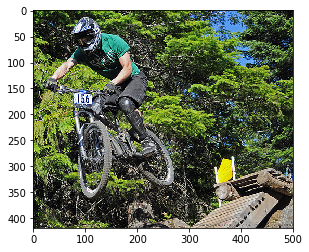

Greedy: a person riding a bike jumping over a dirt hill .
B=3: a person on a bike jumping over a dirt hill .
B=5: a person on a bike jumping over a dirt hill .
B=7: a person on a bike doing a jump in front of trees .


In [63]:
pic = list(encoding_test.keys())[0]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

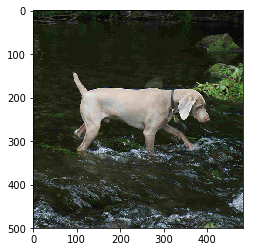

Greedy: a dog leaps in the water .
B=3: a dog runs through the water with a stick in its mouth .
B=5: a dog runs through the water with a stick in its mouth .
B=7: a dog runs through the water with a big stick .


In [64]:
pic = list(encoding_test.keys())[1]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

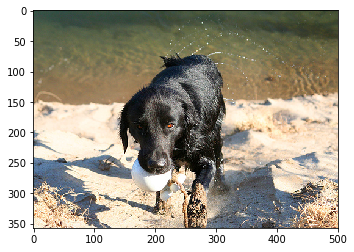

Greedy: a black dog is carrying a ball in its mouth .
B=3: a black dog in the water with a tennis ball in its mouth .
B=5: a black dog in the water with a ball in its mouth .
B=7: a black dog swimming in the water with a tennis ball in its mouth .


In [65]:
pic = list(encoding_test.keys())[2]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

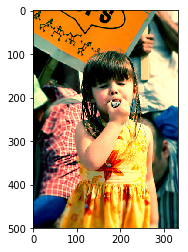

Greedy: a woman in a is holding a .
B=3: a woman in a is wearing a .
B=5: a woman in front of a crowd of a .
B=7: a woman in front of a baby in a .


In [66]:
pic = list(encoding_test.keys())[3]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

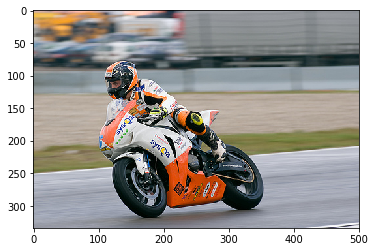

Greedy: a motorcyclist racing .
B=3: a motorcycle racer in a black helmet on a track .
B=5: a man on a track .
B=7: a person on a red motorcycle around a track .


In [67]:
pic = list(encoding_test.keys())[4]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

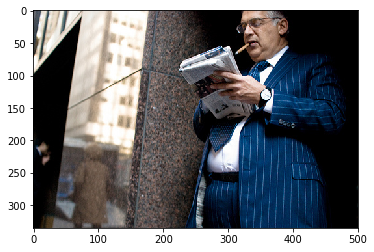

Greedy: a woman in a black jacket is two .
B=3: two people are standing on a on a on a .
B=5: there is two men on a on a with two other people on the street .
B=7: there is two women standing on a .


In [68]:
pic = list(encoding_test.keys())[5]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

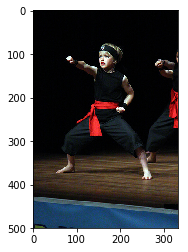

Greedy: a boy in a orange shirt is jumping on a parking lot .
B=3: a boy in a orange shirt is jumping on a parking lot .
B=5: a young man wearing a red shirt jumps in a parking lot .
B=7: a little boy in a red shirt jumps in a parking lot .


In [69]:
pic = list(encoding_test.keys())[6]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

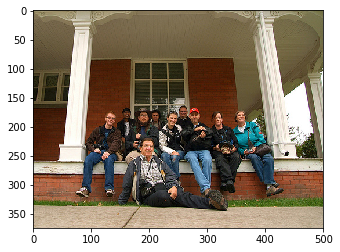

Greedy: a group of people in front of a building .
B=3: a group of people in front of a building in front of a building .
B=5: a group of people in front of a group of a group of a building .
B=7: a group of people in front of a group of a group of a building .


In [70]:
pic = list(encoding_test.keys())[7]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 9))
print("B=7:", beamSearch(image, beam_width = 11))

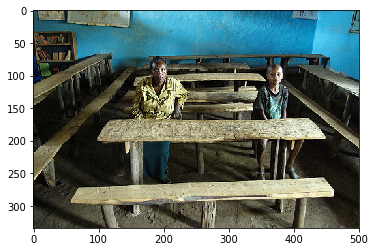

Greedy: a man sitting on a bench at a bench .
B=3: a man sits on a bench at a table at a wooden bench .
B=5: a man sits on a bench at a table at a wooden bench .
B=7: a man sits on a bench at the edge of a body of water .


In [71]:
pic = list(encoding_test.keys())[8]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

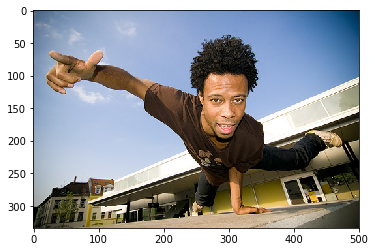

Greedy: a boy in a brown shirt is jumping on a skateboard .
B=3: a young boy in a brown shirt on a skate ramp .
B=5: a young boy in a brown shirt on a skate ramp .
B=7: a little boy in a brown shirt is skateboarding on the edge of a ramp .


In [72]:
pic = list(encoding_test.keys())[9]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

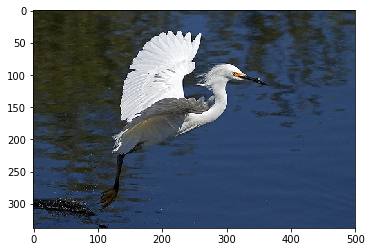

Greedy: a white bird flies over the water .
B=3: a white bird in white bird in front of white bird .
B=5: there is flying over the white bird .
B=7: brown and white bird flies through the white bird .


In [61]:
pic = list(encoding_test.keys())[10]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

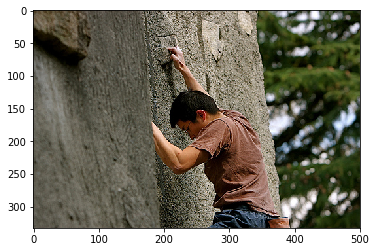

Greedy: a boy in a red shirt is climbing a large rock .
B=3: a boy in a red shirt is climbing a large rock .
B=5: a boy in a red shirt is climbing up a large rock .
B=7: a boy in a red shirt is climbing up a large rock .


In [83]:
i=11
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

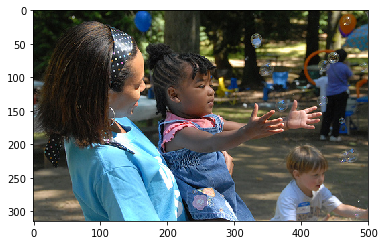

Greedy: a young boy in a purple shirt is standing in a crowd of people
B=3: a little boy in a purple shirt is getting ready to throw a woman in the air .
B=5: a little boy in a purple shirt is getting ready to throw a woman in the air .
B=7: a little boy in a purple shirt is getting ready to throw a woman in the air .


In [84]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

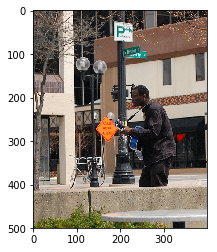

Greedy: a man is standing by a shopping cart by a .
B=3: a man is standing by a shopping cart by a .
B=5: a man is standing next to a who is looking at a side by a shopping cart .
B=7: a man is standing next to a writing on a shopping cart .


In [85]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

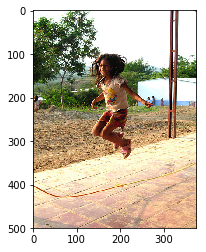

Greedy: a little girl is playing in a pink and a .
B=3: a little girl is playing in a pink and a toddler .
B=5: a little girl is playing in a .
B=7: a little girl in a striped shirt swings on a boots .


In [86]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

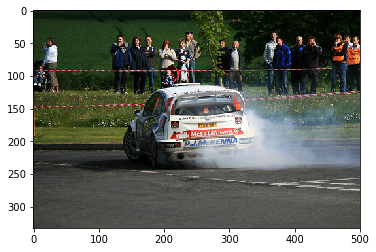

Greedy: two race car on the track .
B=3: two race car in a race car on the track .
B=5: two race car in a race car on a track .
B=7: two race car in a race car on the track .


In [87]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

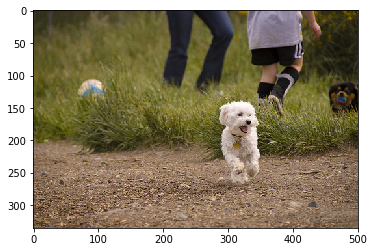

Greedy: a little white dog is running through the grass .
B=3: a black dog is running through the grass with a stick in its mouth .
B=5: a black dog is running through the grass with a stick in its mouth .
B=7: a black dog is running through the grass with a stick in its mouth .


In [88]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

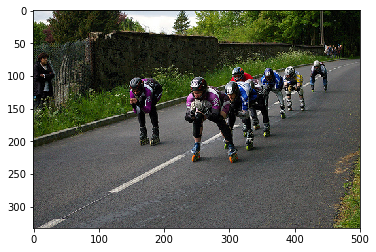

Greedy: two people are riding on a street .
B=3: a group of people are riding on the street in the road .
B=5: a group of people are riding on the street in the road .
B=7: a group of people are riding on the street in the road .


In [89]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

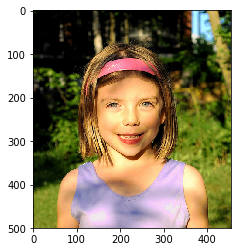

18 
Greedy: a young girl with a pink shirt is smiling .
B=3: a little girl in a pink shirt is smiling .
B=5: a little girl in a pink shirt is smiling .
B=7: a young girl wearing a pink shirt is smiling .


In [90]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

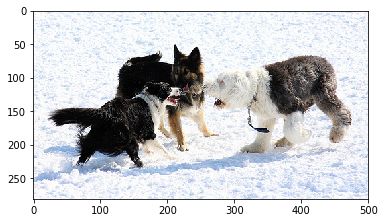

19 
Greedy: two dogs are running on a beach .
B=3: two dogs playing in the water .
B=5: two dogs playing in the water .
B=7: two dogs playing in the water .


In [91]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

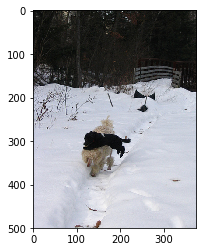

20 
Greedy: two dogs are playing in the snow .
B=3: a black and white dog is running in the snow .
B=5: a black and white dog is running in the snow .
B=7: a black and white dog is running in the snow .


In [92]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

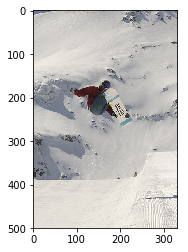

21 
Greedy: a snowboarder jumps over a snowy hill .
B=3: a snowboarder flies through the air on the snow covered mountain .
B=5: a snowboarder flies through the air on the snow covered mountain .
B=7: a snowboarder flies through the air on the snow covered mountain .


In [93]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

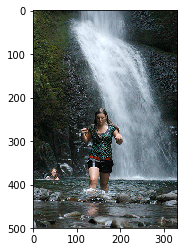

22 
Greedy: a girl in a blue shirt and a waterfall .
B=3: a girl wearing a blue shirt and blue shorts is standing on a waterfall .
B=5: a young girl wearing a blue shirt and splashing in front of a waterfall .
B=7: a little girl wearing a blue shirt and splashing in a yellow shirt is standing in a waterfall .


In [94]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

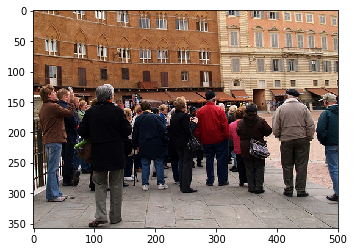

23 
Greedy: two men , two men , two men , two men in the subway
B=3: two men are walking down the street .
B=5: there are two men in the camera on a busy street .
B=7: there are two men walking down the street of a building .


In [95]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

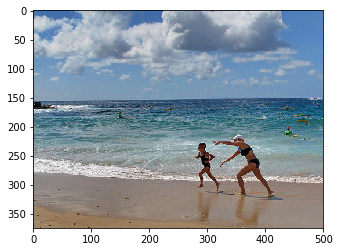

24 
Greedy: a man is running on the beach .
B=3: a woman is walking on the beach on the beach .
B=5: a man in the ocean on the beach at the beach .
B=7: a man in the ocean on the beach at the beach .


In [96]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

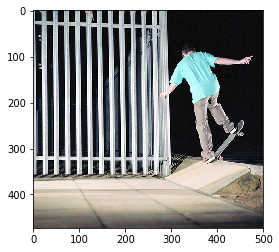

25 
Greedy: a man in a white shirt and white shirt is skateboarding .
B=3: a man in a white shirt and white striped shirt and white shirt and white jacket .
B=5: a man in blue shirt and white striped shirt and white striped shirt and white striped shirt and white .
B=7: a man wearing a white shirt and white shirt and white striped shirt and white shirt and white shirt .


In [98]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

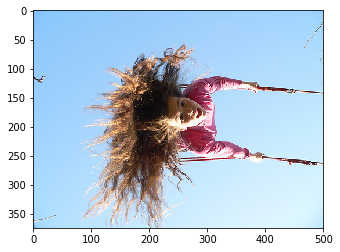

26 
Greedy: a man is standing in a parking lot .
B=3: a man is going down a sidewalk .
B=5: a man is performing a trick in a parking lot .
B=7: a man is performing a trick in a parking lot .


In [99]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

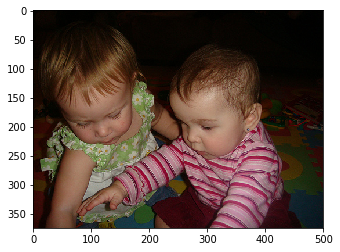

27 
Greedy: a baby is jumping over a baby .
B=3: a young boy is jumping over a baby .
B=5: a young boy is jumping over a baby fight .
B=7: a baby looks at the camera .


In [100]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

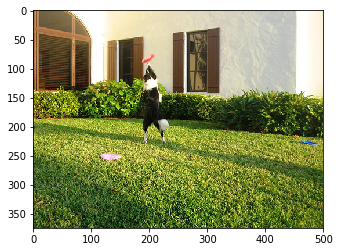

28 
Greedy: a girl in a frisbee in a grassy area .
B=3: a woman with a ball in front of a grassy area .
B=5: a woman with a ball in front of a grassy area .
B=7: a woman with a ball in front of a grassy area .


In [101]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

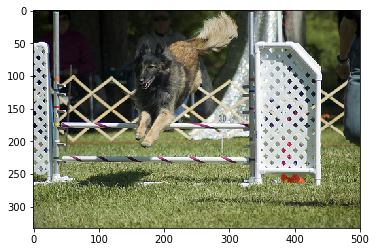

29 
Greedy: a dog jumps over a hurdle .
B=3: a black dog jumps over a fence in the grass .
B=5: a dog is jumping over a fence in the grass .
B=7: a black dog is jumping over a fence with a fence in the background .


In [102]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

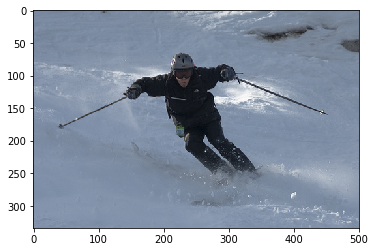

30 
Greedy: a woman skis down a snowy hill .
B=3: a woman skis down a snowy hill .
B=5: a woman skis down a snowy hill .
B=7: a woman skis down a snowy hill .


In [103]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

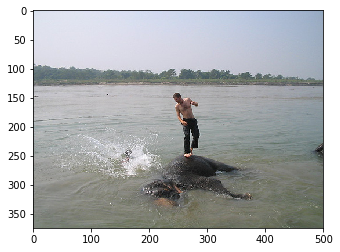

31 
Greedy: a boy is standing in the ocean .
B=3: a little boy is standing in the ocean .
B=5: a little boy is standing in the ocean .
B=7: a little boy is playing in the ocean .


In [104]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

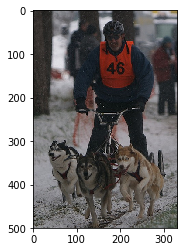

32 
Greedy: a man is pulling a sled in the snow .
B=3: a group of dogs are pulling a sled in the snow .
B=5: a group of dogs are pulling a sled in the snow .
B=7: a group of dogs are pulling a sled in the snow .


In [105]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

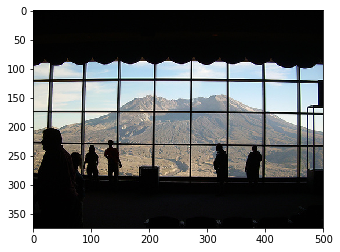

33 
Greedy: a of a coat is standing in the water .
B=3: a jumps in a coat is looking at the camera .
B=5: a jumps in a coat is looking at the camera .
B=7: a person in a coat is standing next to at the top of a .


In [106]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

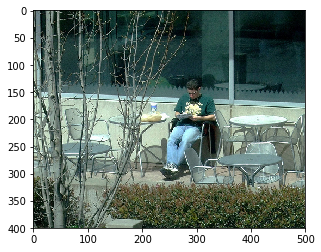

34 
Greedy: a man and a white shirt is holding a small child in a red shirt holding a blue shirt
B=3: a young man in a blue shirt is holding a red and white shirt standing in front of a .
B=5: a little boy in a blue shirt is holding a red and white flowers in the background .
B=7: a little boy in a blue shirt is holding a red and white flowers in the background .


In [107]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

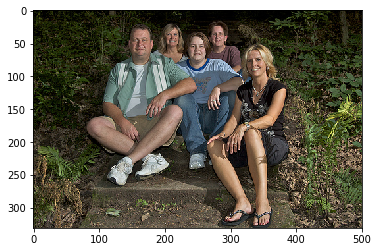

35 
Greedy: a man and woman are sitting on a rocky path .
B=3: a man and woman posing for a picture .
B=5: a couple posing for a picture .
B=7: a couple posing for a picture .


In [108]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

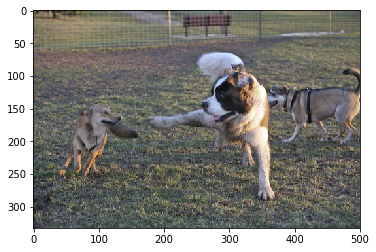

36 
Greedy: two dogs are running through a field .
B=3: two dogs are running through a grassy area .
B=5: two dogs are running through a grassy area .
B=7: two dogs are running through a grassy area .


In [109]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

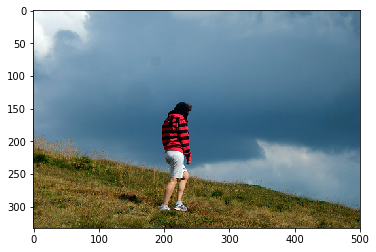

37 
Greedy: a woman in a striped suit is walking on a grassy path .
B=3: a woman in a striped suit is walking on a grassy path in a woods .
B=5: a woman in a striped suit is walking on a grassy path in the woods .
B=7: a woman in a striped suit is walking on a grassy path in the woods .


In [110]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

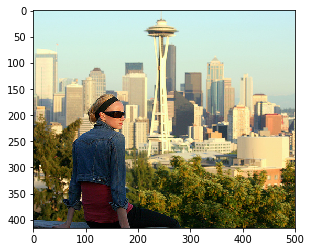

38 
Greedy: a young boy in the red shirt is standing on a shirt and a shirt stands on the stone
B=3: a young boy in a shirt is standing on a red shirt stands on a stone in front of .
B=5: a picture of a red shirt stands on a rock in front of the background .
B=7: a picture of a red shirt stands on a woman in front of a stone wall in front of .


In [111]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

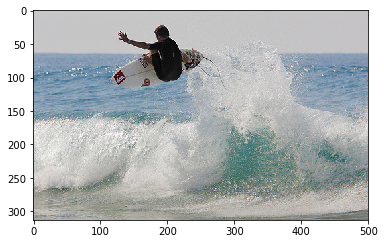

39 
Greedy: a man surfing a wave .
B=3: a man on a surfboard is surfing on a wave .
B=5: a man on a surfboard is surfing on a wave .
B=7: a man on a surfboard is surfing down a wave .


In [112]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

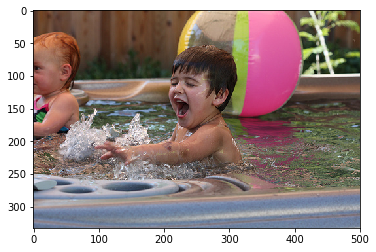

40 
Greedy: two boys are playing in the water .
B=3: two children are playing in the water .
B=5: two children are playing in the water .
B=7: two children are playing in the water .


In [113]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

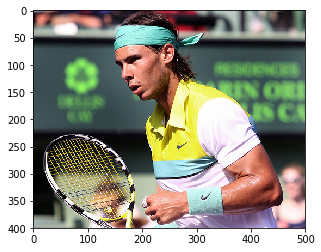

41 
Greedy: a woman in a tennis racket on the court .
B=3: a woman in a tennis racket on the court .
B=5: a woman with a tennis racket on the court .
B=7: a woman with a tennis racket on the court .


In [114]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

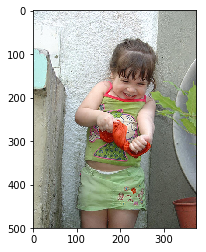

42 
Greedy: a young girl in a red shirt and a .
B=3: a young girl in a red shirt is holding a .
B=5: a young girl in a red shirt is holding a in a .
B=7: a little girl in a red is holding a toy .


In [115]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

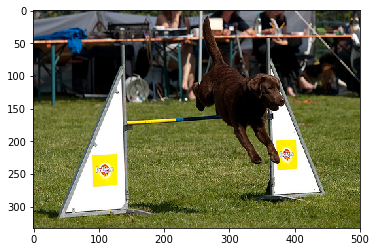

43 
Greedy: a brown dog is running through a grassy area with a hurdle .
B=3: a brown dog jumps over a hurdle .
B=5: a brown dog jumps over a hurdle in a grassy area .
B=7: a brown dog jumps over a hurdle in a grassy area .


In [116]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

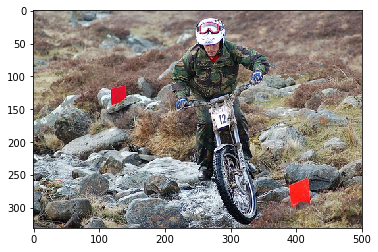

44 
Greedy: a man in a helmet is riding a dirt bike .
B=3: a man is riding a jump on a dirt bike .
B=5: a man is riding a jump on a bmx bike .
B=7: a man is riding a jump on a dirt bike .


In [117]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

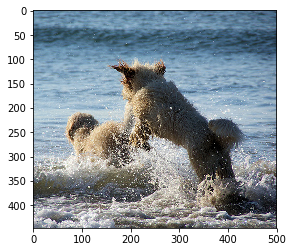

45 
Greedy: two dogs run in the water .
B=3: two dogs are running in the water in the grass .
B=5: two dogs are playing in the water on the beach .
B=7: two dogs are playing in the water .


In [118]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

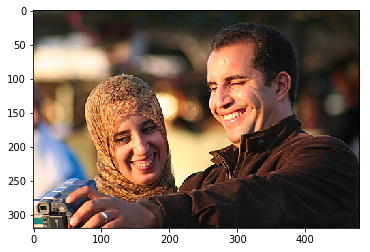

46 
Greedy: a man in a shirt is talking .
B=3: a man in a black shirt is performing a on the air .
B=5: a picture of a man in the background .
B=7: a picture of a man wearing a on the background .


In [119]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

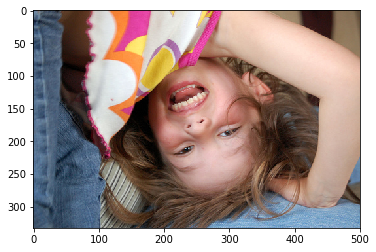

47 
Greedy: a girl in a purple shirt is holding a pink and a game .
B=3: a little girl in a purple shirt is holding a pink and a toy .
B=5: a little girl in a purple shirt is holding a pink and a yellow toy .
B=7: a little girl in a purple shirt is holding a pink and looks at the camera .


In [120]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

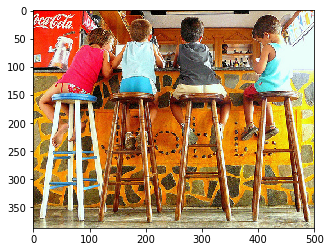

48 
Greedy: a man in a yellow shirt is standing in front of a carnival .
B=3: a boy in a red shirt is standing in front of a carnival .
B=5: a boy in a red shirt is standing in front of a carnival .
B=7: a boy in a red shirt is standing in front of a group of a carnival .


In [121]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

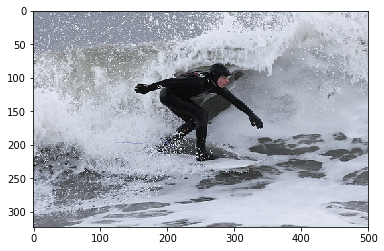

49 
Greedy: two people are riding on a snowy mountain .
B=3: two people on a surfboard in the snow .
B=5: two people on a surfboard in the snow .
B=7: two people play in the snow .


In [122]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

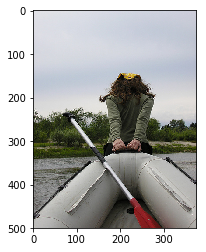

50 
Greedy: two girls on a boat .
B=3: two girls on a boat .
B=5: two girls on a slide .
B=7: two children are on a .


In [123]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

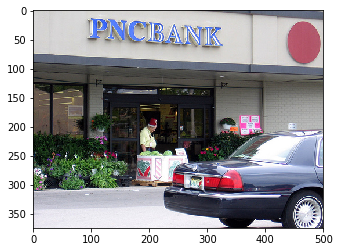

51 
Greedy: a woman in a store .
B=3: two people stand outside of a store .
B=5: two people stand outside of a store .
B=7: two people stand in front of a store .


In [124]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

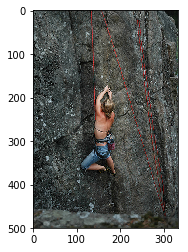

52 
Greedy: a man climbing a rock climbing a rock .
B=3: a boy climbing a rock wall .
B=5: a boy climbing a rock wall .
B=7: a man climbing up a rock wall .


In [125]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

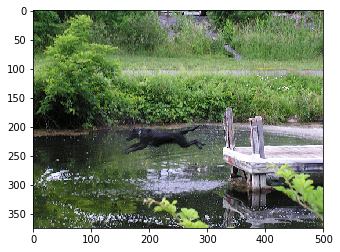

53 
Greedy: a black and a brown shirt is splashing in a body of water .
B=3: a black and splashing in a body of water .
B=5: a black and splashing in a body of water .
B=7: a black and a brown hair splashing in a body of water .


In [126]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

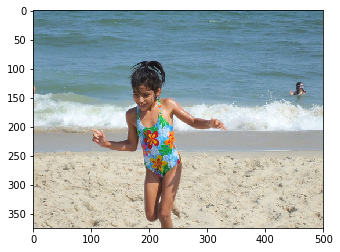

54 
Greedy: a girl in a pink bathing suit is playing in the beach .
B=3: a little girl in the ocean .
B=5: a little girl in an orange bathing suit is playing in the beach .
B=7: a little girl in an orange bathing suit is playing on the beach .


In [127]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

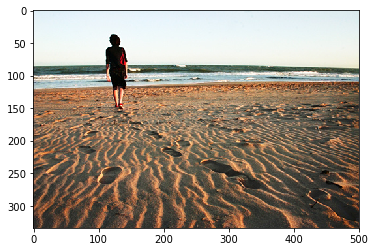

55 
Greedy: a boy is walking on the beach with the ocean .
B=3: a boy is walking on the beach carrying a dog on the beach .
B=5: a boy is walking on the beach , at the beach carrying a beach .
B=7: a boy and a dog walking on the beach at the beach .


In [128]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

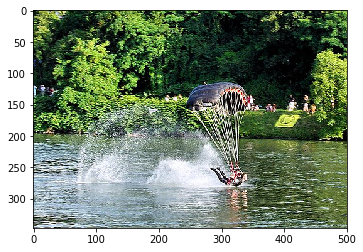

56 
Greedy: a person flying through the air .
B=3: two people are riding in the water .
B=5: two people hang out in the water .
B=7: two people are playing in the water .


In [129]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

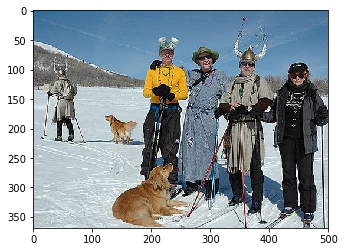

57 
Greedy: a man and a dog are pulling a dog in the snow .
B=3: a man and a dog in the snow .
B=5: a man and a dog running in the snow .
B=7: a man and a dog running in the snow .


In [130]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

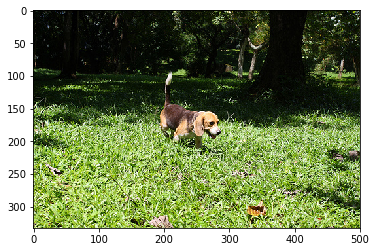

58 
Greedy: a dog is chasing a ball in the grass .
B=3: a tan dog is chasing a yellow ball in its mouth .
B=5: a tan dog is chasing a yellow ball in its mouth .
B=7: a tan dog is chasing a yellow ball in its mouth .


In [131]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

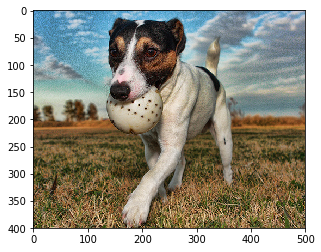

59 
Greedy: a white dog with brown and black collar is running through a field .
B=3: a black and white dog jumping in a field .
B=5: a black and white dog jumping in a field .
B=7: a black and white dog jumping in a field .


In [132]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

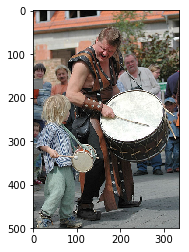

60 
Greedy: a woman in a white dress is standing by a band .
B=3: a girl in a white dress is standing by a band .
B=5: a woman in a white shirt is standing next to a carnival .
B=7: a woman in a white shirt is standing next to a carnival .


In [133]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

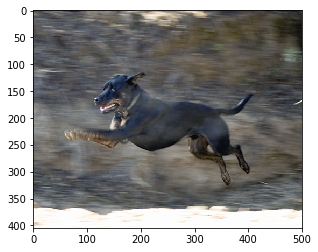

61 
Greedy: a black dog runs through the woods .
B=3: a black dog runs through the woods .
B=5: a black dog wearing a blue collar is running through the grass .
B=7: a black dog wearing a blue collar is running through the water .


In [134]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

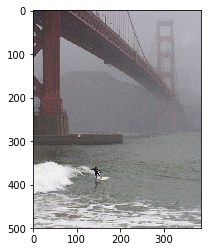

62 
Greedy: two men are standing next to a body of water .
B=3: two people are standing beside a body of water .
B=5: two people are standing next to a body of water .
B=7: two people are standing next to a body of water .


In [135]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

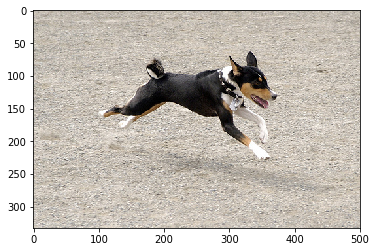

63 
Greedy: two dogs are playing on the ground .
B=3: two dogs are playing on the ground .
B=5: two dogs are playing on the ground .
B=7: two dogs are playing on the ground .


In [136]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

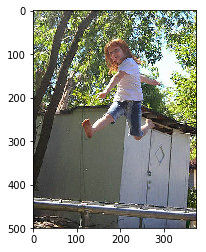

64 
Greedy: a boy jumps on a red concrete wall .
B=3: a young boy jumps over a concrete wall next to a red pole .
B=5: a young boy wearing a red shirt jumps over a concrete wall .
B=7: a young boy wearing a red shirt jumps over a concrete wall .


In [137]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

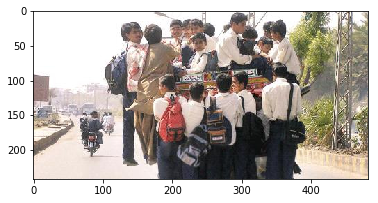

65 
Greedy: many people are walking on a street .
B=3: many people are walking on the street .
B=5: a group of people standing on a sidewalk .
B=7: a group of people stand on a sidewalk .


In [138]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

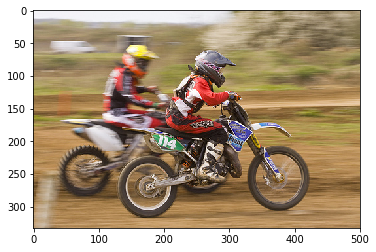

66 
Greedy: a motorcyclist in a red and black motorcycle .
B=3: a motorcycle racer is driving on a track .
B=5: a motorcycle racer is turning a wheelie on the track .
B=7: a motorcycle racer down a turn on a track .


In [139]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

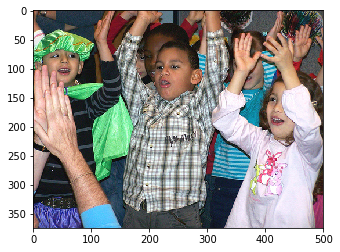

67 
Greedy: two young men are standing in a picture of a crowd of people .
B=3: a man in a white shirt and a man in a girl in a picture .
B=5: a man in a white shirt and a man in a girl in a picture .
B=7: a man in a white shirt and a boy in a girl in a picture .


In [140]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

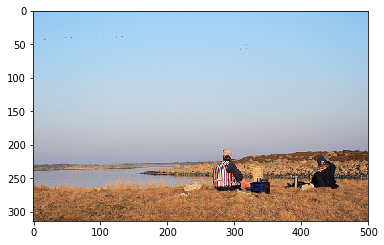

68 
Greedy: a woman is standing on a .
B=3: a woman is standing on a yellow next to a tall grass .
B=5: a woman is standing on a while standing next to a picture of a tall grass .
B=7: a woman is standing on a yellow next to a fishing in front of a ocean .


In [141]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

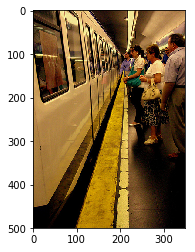

69 
Greedy: a man in a woman with a subway .
B=3: three people waiting for the train .
B=5: three people waiting for the train .
B=7: three people waiting for the train .


In [142]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

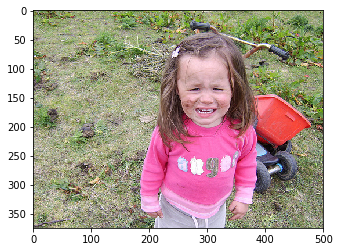

70 
Greedy: a young girl is smiling with a pink shirt is standing in the grass .
B=3: a young girl with a pink shirt is standing in the park .
B=5: a little girl in a pink shirt is laughing .
B=7: a little girl in a pink shirt is playing with a park .


In [143]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

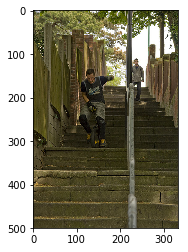

71 
Greedy: a man walks on a sidewalk with a fence .
B=3: a man and a woman standing on a sidewalk .
B=5: a man and a woman standing on a sidewalk .
B=7: a man and a woman standing on a sidewalk .


In [144]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

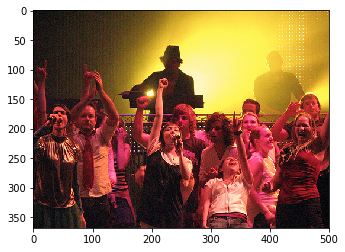

72 
Greedy: a crowd of people taking pictures in a picture .
B=3: a crowd of people taking pictures in a picture .
B=5: a crowd of people standing in a room at a camera .
B=7: a crowd of people in a room at a camera .


In [145]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

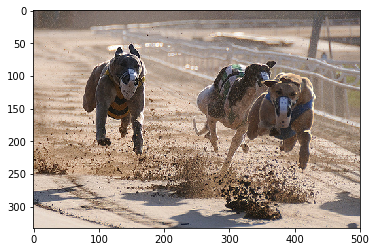

73 
Greedy: a dog and a woman are running in the dirt .
B=3: two dogs are running on the dirt track .
B=5: two dogs are running through the dirt .
B=7: two dogs are running in the dirt .


In [146]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

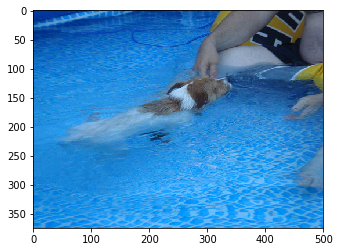

74 
Greedy: a dog is standing in a swimming pool with a blue ball in its mouth .
B=3: a brown dog is jumping out of a swimming pool with a red ball in its mouth .
B=5: a brown and white dog is jumping out of a swimming pool .
B=7: a brown and white dog is jumping out of a swimming pool .


In [147]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

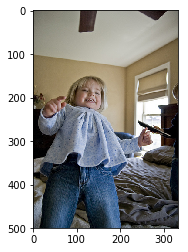

75 
Greedy: a boy in a blue jeans , a red shirt , and blue jeans , standing in front of
B=3: a little boy in a blue jeans is standing next to a table with a red dress .
B=5: a little boy in a blue jeans is standing next to a piece of a red dress .
B=7: a little boy in a blue jeans is standing next to a piece of a red dress .


In [148]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

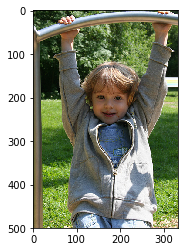

76 
Greedy: a little girl is hanging upside down on a pole .
B=3: a little girl in a green shirt hangs upside down on the park .
B=5: a little girl in a green shirt hangs upside down on the park .
B=7: a little girl hangs upside down on a pole .


In [149]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

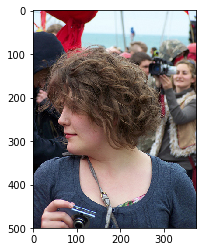

77 
Greedy: a boy in a blue shirt is looking at a .
B=3: a boy in a red shirt looks at the camera .
B=5: a boy in a red shirt looks at the camera .
B=7: a boy in a red shirt looks at the camera .


In [150]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

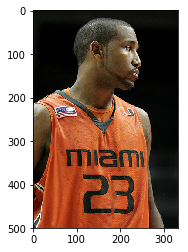

78 
Greedy: a man in a blue shirt is wearing a red shirt .
B=3: a man in a red shirt is wearing a blue tank top and a basketball .
B=5: a man is wearing a red shirt is wearing a basketball .
B=7: a man is wearing a red shirt is wearing a basketball .


In [151]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

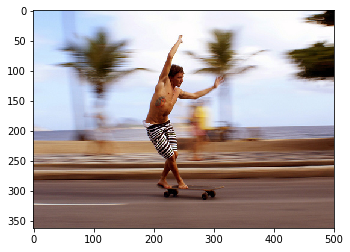

79 
Greedy: a man in red shorts runs on a path .
B=3: a man jumping in the air on a red shirt is running in the shore .
B=5: a young man jumping in the air on a shore of a parking lot .
B=7: a man is jumping in the air on a shore of a body of water .


In [152]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

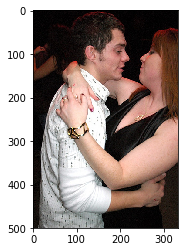

80 
Greedy: a woman with a man in a black shirt and a man in a man in the camera .
B=3: a woman in a blue shirt and a man is posing for a picture .
B=5: a man and a woman pose for a picture at a picture .
B=7: a man and a woman pose for a picture at a picture .


In [153]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

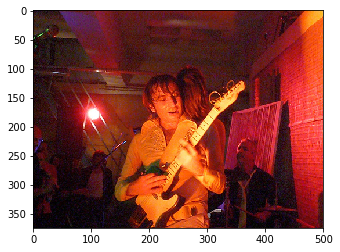

81 
Greedy: a man in a guitar for a .
B=3: a man plays a guitar for a .
B=5: a man is standing in a guitar for a microphone .
B=7: a man is standing in a guitar for a room .


In [154]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

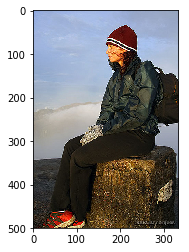

82 
Greedy: two man wearing a backpack .
B=3: a man wearing a backpack is standing next to a mountain .
B=5: a man wearing a backpack is standing next to a mountain .
B=7: a man wearing a backpack is standing next to a mountain .


In [155]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

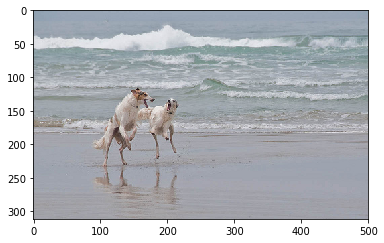

83 
Greedy: a black dog is jumping in the air on the beach .
B=3: a white dog is jumping in the air on the shore .
B=5: a white dog is jumping in the air on the shore .
B=7: a white dog is jumping in the air on the shore .


In [156]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

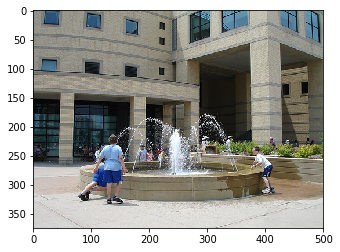

84 
Greedy: a woman in a fountain .
B=3: two people are playing in front of a fountain .
B=5: two people are playing in front of a fountain .
B=7: two people are playing in front of a fountain .


In [157]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

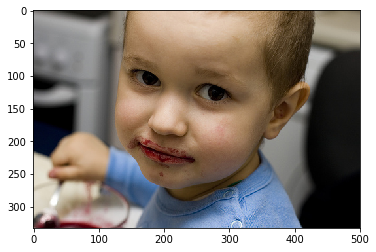

85 
Greedy: a boy with a blue shirt is holding a baby who is holding a blue toy .
B=3: a blonde boy is holding a baby who is holding a blue toy .
B=5: a blonde blonde boy holds a baby who is wearing a blue shirt .
B=7: a blonde blonde boy holds a baby who is wearing a blue shirt .


In [158]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

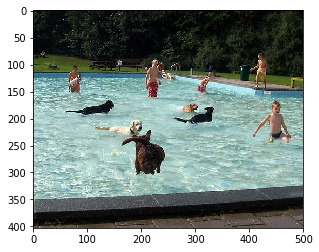

86 
Greedy: two children in the water .
B=3: two dogs are playing in the water .
B=5: two dogs are playing in the water .
B=7: two dogs are playing in the water .


In [159]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

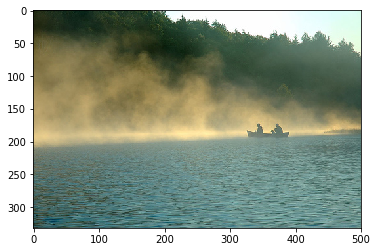

87 
Greedy: a black and a woman are jumping out of a body of water .
B=3: a black and a stick in the water .
B=5: a boat is attempting to see in the water .
B=7: a boat is attempting to see in the water .


In [160]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

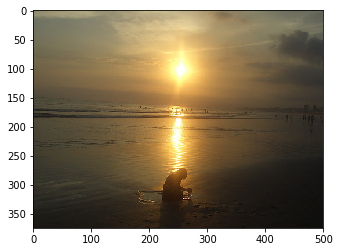

88 
Greedy: a man is standing on the ocean and a boat on the shore .
B=3: a man stands on the edge of the ocean and a boat on the ocean .
B=5: a man stands on the edge of the ocean and a boat on the ocean .
B=7: a man stands on the edge of the ocean and a boat on the ocean in the ocean .


In [161]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

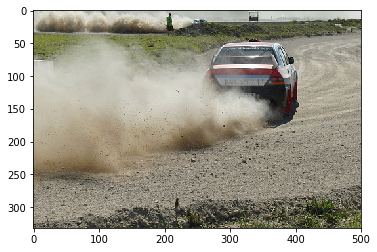

89 
Greedy: a person is driving through a large rocks .
B=3: a is driving through some mud .
B=5: a is driving through some mud .
B=7: a is driving through some mud .


In [162]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

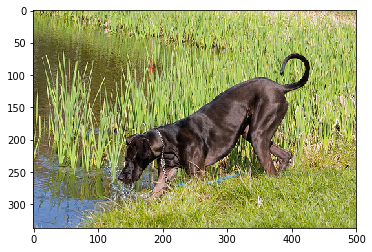

90 
Greedy: a black dog running through a field .
B=3: a black dog runs through a field .
B=5: a black dog runs through a field .
B=7: a large black dog runs through a field .


In [163]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

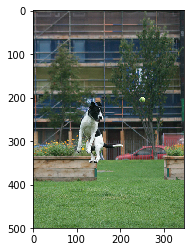

91 
Greedy: a black and white dog jumping over a ball in a yard .
B=3: a black and white dog jumping over a ball in front of a yard .
B=5: a black and white dog jumping over a tennis ball in a yard .
B=7: a black and white dog jumping over a tennis ball in a yard with a yard .


In [164]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

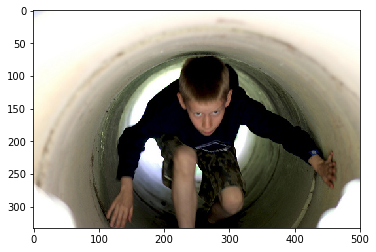

92 
Greedy: a little boy is on the water on the floor with a over the floor .
B=3: a little boy in the water on the swings on the swings on the floor .
B=5: a little boy slides down a yellow slide on a slide .
B=7: a little boy slides down a water on a slide .


In [165]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

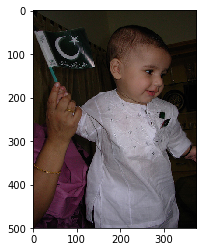

93 
Greedy: a boy in a room .
B=3: a young boy wearing a blue shirt is taking a room .
B=5: a young boy wearing a blue shirt is taking a room .
B=7: a young boy wearing a blue shirt shows to his arms around his arms as he stands next to .


In [166]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

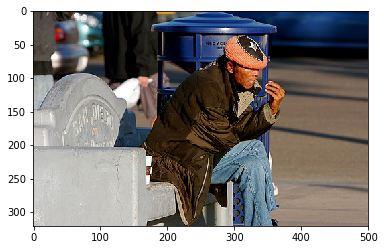

94 
Greedy: a man wearing a red jacket and a little boy wearing a cap is sitting on a skateboard .
B=3: a man wearing a red jacket and a little boy wearing a hat on a skateboard .
B=5: a man wearing a hat and a little boy wearing a little boy wearing a red jacket .
B=7: a man wearing a cowboy hat and a little boy wearing a red jacket next to a skateboard .


In [167]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

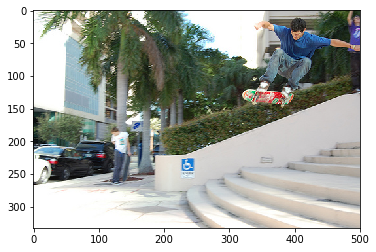

95 
Greedy: a boy jumps over a skateboard .
B=3: a boy in a yellow shirt jumps over a skateboard .
B=5: a young boy jumps off of a skateboard .
B=7: a young boy jumps off of a mound of stairs .


In [168]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

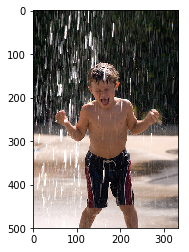

96 
Greedy: a little boy is running through water .
B=3: a little boy runs through the water .
B=5: a little boy runs through the water .
B=7: a little boy plays in a spray of water .


In [169]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

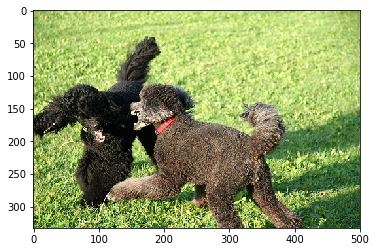

97 
Greedy: a black dog with a red toy in the grass .
B=3: a black dog with a red toy in the grass .
B=5: a black dog with a red toy in the grass .
B=7: a black dog with a red toy in the grass .


In [170]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

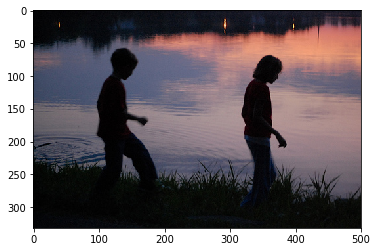

98 
Greedy: two boys are running along a field .
B=3: two boys are running along a field .
B=5: two boys are running along a field .
B=7: two boys are running along a field .


In [171]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

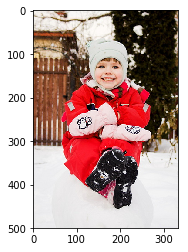

99 
Greedy: a young boy in the air with a red and red snow .
B=3: a young boy in the air in the snow with a red ball in the ice .
B=5: a young boy in the air in the snow with a red ball in the ice .
B=7: a young boy in the air in the snow with a red ball in the ice .


In [172]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

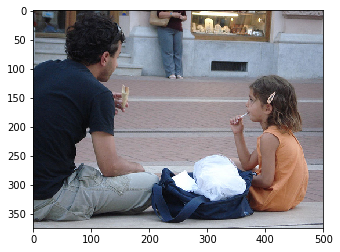

100 
Greedy: two men , one with a man , and a woman wearing a other children , a on a
B=3: two men , one looking down on the street .
B=5: two men sitting on a sidewalk next to a couch .
B=7: two men sitting on a sidewalk next to a bunch of each other .


In [173]:
i+=1
pic = list(encoding_test.keys())[i]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print(i,"\nGreedy:",greedySearch(image))
print("B=3:", beamSearch(image, beam_width = 3))
print("B=5:", beamSearch(image, beam_width = 5))
print("B=7:", beamSearch(image, beam_width = 7))

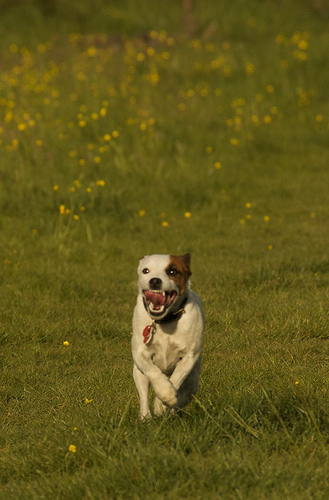

In [50]:
pic = list(encoding_test.keys())[159]
Image.open(images+pic)

In [51]:
caption_len = 15
caption=[]
mask = np.zeros((caption_len, n_words))
image = encoding_test[pic]
image = image.reshape((1,2048))
mask = np.zeros((caption_len, n_words))
for i in range(1, caption_len):
    if i == 1:
        cur_word = 0
    else:
        cur_word = next_word
    mask[i,:] = np.logical_or(mask[i,:], mask[i-1,:])
    mask[i, cur_word] = 1
    
    pos = np.zeros(maxlen)
    pos[i-1] = 1
    
    pred = model.predict([np.array(image), np.array([cur_word]), np.array([mask[i-1,:]]), np.array([pos])])[0]
    next_word = pred.argmax()
    
    caption.append(ixtoword[next_word])
    if ixtoword[next_word] == '.':
        break

' '.join(caption)

'a dog runs through the grass .'